------
# **Dementia Patients -- Analysis and Prediction**
### ***Author : Akhilesh Vyas***
### ****Date : August, 2019****



# ***Result Plots***

- <a href='#00'>0. Setup </a>
    - <a href='#00.1'>0.1. Load libraries </a>
    - <a href='#00.2'>0.2. Define paths </a>

- <a href='#01'>1. Data Preparation </a>  
    - <a href='#01.1'>1.1. Read Data </a> 
    - <a href='#01.2'>1.2. Prepare data  </a>
    - <a href='#01.3'>1.3. Prepare target </a>
    - <a href='#01.4'>1.4. Removing Unwanted Features </a>
    
- <a href='#02'>2. Data Analysis</a> 
    - <a href='#02.1'>2.1. Feature </a> 
    - <a href='#02.2'>2.2. Target </a> 
    
- <a href='#03'>3. Data Preparation and Vector Transformation</a>

- <a href='#04'>4. Analysis and Imputing Missing Values </a>

- <a href='#05'>5. Feature Analysis</a> 
    - <a href='#05.1'>5.1. Correlation Matrix</a>
    - <a href='#05.2'>5.2. Feature and target </a>
    - <a href='#05.3'>5.3. Feature Selection Models </a>
    
- <a href='#06'>6.Machine Learning -Classification Model</a> 

# <a id='00'>0. Setup </a>

# <a id='00.1'>0.1 Load libraries </a>

Loading Libraries

In [1]:
import sys
sys.path.insert(1, '../preprocessing/')
import numpy as np
import pickle
import scipy.stats as spstats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
from sklearn.datasets.base import Bunch
from data_transformation_cls import FeatureTransform
from ast import literal_eval
import plotly.figure_factory as ff
import plotly.offline as py
import plotly.graph_objects as go

import pandas as pd
pd.set_option('display.max_columns', None)  
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', -1)


%matplotlib inline

# <a id='00.2'>0.2 Define paths </a>

In [2]:
# data_path
data_path = '../../../datalcdem/data/optima/dementia_18July/class_dataanalysis_misdiag/'
result_path = '../../../datalcdem/data/optima/dementia_18July/class_dataanalysis_misdiag/results/'

# <a id='1'>1. Data Preparation </a> 

## <a id='01.1'>1.1. Read Data</a>

In [3]:
# Reading Data

#patients data
patient_df = pd.read_csv(data_path+'patients.csv')
print (patient_df.dtypes)
# change dataType if there is something
for col in patient_df.columns: 
    if 'Date' in col:
        patient_df[col] = pd.to_datetime(patient_df[col]) 
 
display(patient_df.head(5))

patient_id                   int64  
gender                       object 
dementia                     bool   
smoker                       object 
alcohol                      object 
education                    object 
bmi                          float64
weight                       float64
ageAtFirstEpisode            int64  
ageAtLastEpisode             int64  
malignantComorbidity         object 
systemicComorbidity          object 
cardiovascularComorbidity    bool   
metabolicComorbidity         bool   
infectiousComorbidity        bool   
neoplasticComorbidity        bool   
respiratoryComorbidity       bool   
neurologicalComorbidity      bool   
inflammatoryComorbidity      bool   
apoe                         object 
epDateInicial                object 
mmseInicial                  int64  
mmseInicialDiscretized       object 
epDateFinal                  object 
mmseFinal                    int64  
mmseFinalDiscretized         object 
epDateToSevereData           object 
e

,patient_id,gender,dementia,smoker,alcohol,education,bmi,weight,ageAtFirstEpisode,ageAtLastEpisode,malignantComorbidity,systemicComorbidity,cardiovascularComorbidity,metabolicComorbidity,infectiousComorbidity,neoplasticComorbidity,respiratoryComorbidity,neurologicalComorbidity,inflammatoryComorbidity,apoe,epDateInicial,mmseInicial,mmseInicialDiscretized,epDateFinal,mmseFinal,mmseFinalDiscretized,epDateToSevereData,epDateToMildData,epDateToModerateData
0,1,Male,False,smoker,mild_drinking,medium,28.0,81.0,71,80,False,False,False,False,False,False,False,False,False,E3E3,1998-01-13,30,normal,2007-05-04,30,normal,NaT,NaT,NaT
1,14,Female,False,no_smoker,mild_drinking,medium,19.0,48.0,79,88,False,True,True,True,True,False,False,False,False,E3E4,1990-03-26,29,normal,1999-03-19,30,normal,NaT,NaT,NaT
2,16,Male,False,no_smoker,extreme_drinking,higher,NaN,NaN,78,84,False,False,True,False,False,False,False,False,False,E3E4,1991-07-15,28,normal,1996-10-21,26,normal,NaT,1995-07-03,NaT
3,19,Male,True,smoker,extreme_drinking,higher,NaN,NaN,56,61,True,True,False,True,False,False,False,False,False,E3E4,1989-09-27,12,severe,1994-07-06,-1,severe,1989-09-27,NaT,1990-03-27
4,32,Male,False,no_smoker,mild_drinking,higher,NaN,NaN,72,73,False,False,False,False,False,False,False,False,False,E3E3,1990-05-04,15,moderate,1991-03-26,-1,severe,NaT,NaT,1990-05-04


In [4]:
# From API Data- comorbidities and treatments

# Treatment data
treatmnt_df = pd.read_csv(data_path+'Treatments.csv')
display(treatmnt_df.head(5))
treatmnt_dict = dict(zip(treatmnt_df['name'], treatmnt_df['CUI_ID']))
print ('\n Unique Treatment data size: {}\n'.format(len(treatmnt_dict)))

# Patient treatment data
patient_treatmnt_df = pd.read_csv(data_path+'patient_Treatments.csv')
patient_treatmnt_df['drugName_cui'] = patient_treatmnt_df['drugName'].apply(lambda x: treatmnt_dict[x])
# patient_treatmn_list_df = patient_treatmnt_df.groupby(by='patient_id', as_index=False).agg(lambda x: x.tolist()) # equivalent to below\n",
patient_treatmn_list_df = patient_treatmnt_df.groupby(by='patient_id', as_index=False).agg(lambda x: x.tolist())
display(patient_treatmn_list_df.head(5))

# Patient comorbidities data list
patient_treatmn_list = patient_treatmnt_df['drugName_cui'].unique()
print ('\n Unique Treatment data size: {}, Any NULL Value: {}\n'.format(patient_treatmn_list.size, pd.isnull(patient_treatmn_list).any()))

# Comorbidities data
comorb_df = pd.read_csv(data_path+'comorbidities.csv')
display(comorb_df.head(5))
comorb_dict = dict(zip(comorb_df['name'], comorb_df['CUI_ID']))
print ('\n Unique Comorbidities data size: {}\n'.format(len(comorb_dict)))

# Patient comorbidities data
patient_combor_df = pd.read_csv(data_path+'patient_Comorbidities.csv')
patient_combor_df['disorderName_cui'] = patient_combor_df['disorderName'].apply(lambda x: comorb_dict[x])
patient_combor_list_df = patient_combor_df.groupby(by=['patient_id'], as_index=False).agg(lambda x: x.tolist())
display(patient_combor_list_df.head(5))

# Patient comorbidities data list
patient_combor_list = patient_combor_df['disorderName_cui'].unique()
print ('\n Unique Comorbidities data size: {}, Any NULL Value: {}\n'.format(patient_combor_list.size, pd.isnull(patient_combor_list).any()))

,name,CUI_ID,DBpediaURL
0,Atenolol,C0004147,http://dbpedia.org/resource/Atenolol
1,Calcium_supplements,C3540037,http://dbpedia.org/resource/Creatine_supplements
2,Gliclazide,C0017631,http://dbpedia.org/resource/Gliclazide
3,Diltiazem,C0012373,http://dbpedia.org/resource/Diltiazem
4,Beconase,C0591154,http://dbpedia.org/resource/Beclometasone_dipropionate



 Unique Treatment data size: 213



,patient_id,drugName,drugName_cui
0,1,[Atenolol],[C0004147]
1,14,"[Atenolol, Calcium_supplements, Gliclazide, Diltiazem]","[C0004147, C3540037, C0017631, C0012373]"
2,16,"[Beconase, Acetaminophen, Burinex, Aquacobalamin, Hydroxocobalamin]","[C0591154, C0000970, C0591205, C0003663, C0020316]"
3,19,[Tolbutamide],[C0040374]
4,36,[Magnesium_cation],[C2346927]



 Unique Treatment data size: 213, Any NULL Value: False



,name,CUI_ID,DBpediaURL
0,Diphtheria,C0012546,http://dbpedia.org/resource/Diphtheria
1,Diabetes,C0011847,http://dbpedia.org/resource/Diabetes_mellitus
2,Heart_failure,C0018801,http://dbpedia.org/resource/Heart_failure
3,Transient_ischemic_attack,C0007787,http://dbpedia.org/resource/Transient_ischemic_attack
4,Right_sided_cerebral_hemisphere_cerebrovascular_accident,C0586324,http://dbpedia.org/resource/Stroke



 Unique Comorbidities data size: 84



,patient_id,disorderName,disorderName_cui
0,14,"[Diphtheria, Diabetes, Heart_failure, Transient_ischemic_attack]","[C0012546, C0011847, C0018801, C0007787]"
1,16,"[Right_sided_cerebral_hemisphere_cerebrovascular_accident, Transient_ischemic_attack]","[C0586324, C0007787]"
2,19,[Diabetes],[C0011847]
3,54,[Mitral_valve_prolapse_syndrome],[C0026267]
4,99,"[Bronchiectasis, Myocardial_infarction, Diphtheria]","[C0006267, C0027051, C0012546]"



 Unique Comorbidities data size: 84, Any NULL Value: False



In [5]:
# PSYCHIATRIC DIAGNOSIS 334-351: PRIMARY PSYCHIATRIC DIAGNOSES

In [6]:
#Preparation Features from Raw data

# Patient Comorbidities data
'''patient_com_raw_df = pd.read_csv(data_path + 'optima_patients_comorbidities.csv').groupby(by=['patient_id', 'EPISODE_DATE'], as_index=False).agg(lambda x: x.tolist())[['patient_id', 'EPISODE_DATE', 'Comorbidity_cui']]
display(patient_com_raw_df.head(5))
patient_com_raw_df['EPISODE_DATE'] = pd.to_datetime(patient_com_raw_df['EPISODE_DATE'])


# Patient Treatment data
patient_treat_raw_df = pd.read_csv(data_path + 'optima_patients_treatments.csv').groupby(by=['patient_id', 'EPISODE_DATE'], as_index=False).agg(lambda x: x.tolist())[['patient_id', 'EPISODE_DATE', 'Medication_cui']]
display(patient_treat_raw_df.head(5))
patient_treat_raw_df['EPISODE_DATE'] = pd.to_datetime(patient_treat_raw_df['EPISODE_DATE'])

# Join Patient Treatment and Comorbidities data
patient_com_treat_raw_df = pd.merge(patient_com_raw_df, patient_treat_raw_df,on=['patient_id', 'EPISODE_DATE'], how='outer')
patient_com_treat_raw_df.sort_values(by=['patient_id', 'EPISODE_DATE'],axis=0, inplace=True, ascending=True)
patient_com_treat_raw_df.reset_index(drop=True, inplace=True)
patient_com_treat_raw_df.head(5)


#Saving data
patient_com_treat_raw_df.to_csv(data_path + 'patient_com_treat_episode_df.csv', index=False)'''

# Extracting selected features from Raw data
df_datarequest = pd.read_excel(data_path+'../../optima_excel/' +'Data_Request_Jan_2019_final.xlsx')
display(df_datarequest.head(1))
df_datarequest_features = df_datarequest[['GLOBAL_PATIENT_DB_ID', 'Age At Episode', 'EPISODE_DATE', 'OPTIMA DIAGNOSES V 2010: PETERSEN MCI', 'OPTIMA DIAGNOSES V 2010: PETERSEN MCI TYPE',
                                          'CAMDEX SCORES: MINI MENTAL SCORE', 'DIAGNOSIS 334-351: PRIMARY PSYCHIATRIC DIAGNOSES']]
display(df_datarequest_features.columns)
df_datarequest_features.rename(columns={'GLOBAL_PATIENT_DB_ID':'patient_id', 'Age At Episode':'Age_At_Episode', 'DIAGNOSIS 334-351: PRIMARY PSYCHIATRIC DIAGNOSES':'PSYCHIATRIC',
                                       'OPTIMA DIAGNOSES V 2010: PETERSEN MCI':'PETERSEN_MCI', 'OPTIMA DIAGNOSES V 2010: PETERSEN MCI TYPE':'PETERSEN_MCI_TYPE',
                                       'CAMDEX SCORES: MINI MENTAL SCORE':'MINI_MENTAL_SCORE'}, inplace=True)
display(df_datarequest_features.head(5))
df_datarequest_features.drop(columns=['Age_At_Episode', 'PETERSEN_MCI_TYPE'], inplace=True)
display(df_datarequest_features.head(5))

# Merging Join Patient Treatment, Comorbidities and selected features from raw data
#patient_com_treat_raw_df['EPISODE_DATE'] = pd.to_datetime(patient_com_treat_raw_df['EPISODE_DATE'])
#patient_com_treat_fea_raw_df = pd.merge(patient_com_treat_raw_df,df_datarequest_features,on=['patient_id', 'EPISODE_DATE'], how='left')
#patient_com_treat_fea_raw_df.sort_values(by=['patient_id', 'EPISODE_DATE'],axis=0, inplace=True, ascending=True)
#patient_com_treat_fea_raw_df.reset_index(inplace=True, drop=True)
#display(patient_com_treat_fea_raw_df.head(5))
patient_com_treat_fea_raw_df = df_datarequest_features # Need to be changed ------------------------

# Filling misssing MMSE value with patient group Average
patient_com_treat_fea_raw_df['MINI_MENTAL_SCORE']\
                                        = patient_com_treat_fea_raw_df.groupby(by=['patient_id'])['MINI_MENTAL_SCORE'].transform(lambda x: x.fillna(x.mean()))
display(patient_com_treat_fea_raw_df.head(5))

#  19<=Mild<=24 , 14<=Moderate<=18 , Severe<=13 
def change_minimentalscore_to_category(df):
    df.loc[df['MINI_MENTAL_SCORE']>24,'MINI_MENTAL_SCORE_CATEGORY'] = 'Normal'
    df.loc[(df['MINI_MENTAL_SCORE']<=24) & (df['MINI_MENTAL_SCORE']>=19),
           'MINI_MENTAL_SCORE_CATEGORY'] = 'Mild'
    df.loc[(df['MINI_MENTAL_SCORE']<=18) & (df['MINI_MENTAL_SCORE']>=14),
           'MINI_MENTAL_SCORE_CATEGORY'] = 'Moderate'
    df.loc[df['MINI_MENTAL_SCORE']<=13,'MINI_MENTAL_SCORE_CATEGORY'] = 'Severe'
    
    return df

patient_com_treat_fea_raw_df = change_minimentalscore_to_category(patient_com_treat_fea_raw_df)

# saving file
patient_com_treat_fea_raw_df.to_csv(data_path + 'patient_com_treat_fea_episode_raw_without_expand_df.csv', index=False)

# Set line number for treatment line
def setLineNumber(lst):
    lst_dict = {ide:0 for ide in lst}
    lineNumber_list = []
    
    for idx in lst:
        if idx in lst_dict:
           lst_dict[idx] = lst_dict[idx] + 1 
           lineNumber_list.append(lst_dict[idx])
            
    return lineNumber_list

patient_com_treat_fea_raw_df['lineNumber'] = setLineNumber(patient_com_treat_fea_raw_df['patient_id'].tolist())
display(patient_com_treat_fea_raw_df.head(5))

# Extend episode data into columns
def extend_episode_data(df):
    id_dict = {i:0 for i in df['patient_id'].tolist()}
    for x in df['patient_id'].tolist():
        if x in id_dict:
            id_dict[x]=id_dict[x]+1
    
    line_updated = [int(j) for i in id_dict.values() for j in range(1,i+1)]
    # print (line_updated[0:10])
    df.update(pd.Series(line_updated, name='lineNumber'),errors='ignore')
    print ('\n----------------After creating line-number for each patients------------------')
    display(df.head(20))
    
    # merging episodes based on id and creating new columns for each episode
    r = df['lineNumber'].max()
    print ('Max line:',r)
    l = [df[df['lineNumber']==i] for i in range(1, int(r+1))]
    print('Number of Dfs to merge: ',len(l))
    df_new = pd.DataFrame()
    tmp_id = []
    for i, df_l in enumerate(l):
        df_l = df_l[~df_l['patient_id'].isin(tmp_id)]
        for j, df_ll in enumerate(l[i+1:]):
            #df_l = df_l.merge(df_ll, on='id', how='left', suffix=(str(j), str(j+1))) #suffixe is not working
            #print (j)
            df_l = df_l.join(df_ll.set_index('patient_id'), on='patient_id', rsuffix='_'+str(j+1))
        tmp_id = tmp_id + df_l['patient_id'].tolist()
        #display(df_l)
        df_new = df_new.append(df_l, ignore_index=True, sort=False)
        return df_new
    


patient_com_treat_fea_raw_df['lineNumber'] = setLineNumber(patient_com_treat_fea_raw_df['patient_id'].tolist())
# drop rows with duplicated episode for a patient
patient_com_treat_fea_raw_df = patient_com_treat_fea_raw_df.drop_duplicates(subset=['patient_id', 'EPISODE_DATE'])
patient_com_treat_fea_raw_df.sort_values(by=['patient_id', 'EPISODE_DATE'], inplace=True)
# Expand patient 
#patient_com_treat_fea_raw_df = extend_episode_data(patient_com_treat_fea_raw_df)
display(patient_com_treat_fea_raw_df.head(2))


#Saving extended episode of each patients
#patient_com_treat_fea_raw_df.to_csv(data_path + 'patient_com_treat_fea_episode_raw_df.csv', index=False)



,GLOBAL_PATIENT_DB_ID,STUDY_ID,STUDY,DOD,Age At Episode,GENDER,EPISODE_DATE,EPISODE,CAMDEX ADMINISTRATION 1-12: DATE OF EXAMINATION,CAMDEX ADMINISTRATION 1-12: EST SEVERITY OF DEMENTIA,CAMDEX ADMINISTRATION 1-12: EST OF SEVERITY OF DEPRESSION,CAMDEX ADMINISTRATION 1-12: VISUALLY IMPAIRED,CAMDEX ADMINISTRATION 1-12: HARD OF HEARING,CAMDEX ADMINISTRATION 1-12: TOTALLY CARED FOR,CAMDEX ADMINISTRATION 1-12: OTHER SIGNIFICANT IMPAIRMENT,CAMDEX ADMINISTRATION 1-12: OTHER SIGNIFICANT IMPAIRMENT: TEXT,PRESENT STATE 13-46: PRESENT STATE 13-46,PRESENT STATE 13-46: (013) NAME KNOWN,PRESENT STATE 13-46: (014) AGE KNOWN,PRESENT STATE 13-46: (015) DATE OF BIRTH KNOWN,PRESENT STATE 13-46: (016) AGE LEFT SCHOOL,PRESENT STATE 13-46: (017) YEARS IN FURTHER EDUCATION,PRESENT STATE 13-46: (017) YEARS IN FURTHER EDUCATION: TEXT,PRESENT STATE 13-46: (018) LIVING ARRANGEMENTS,PRESENT STATE 13-46: (019) HEADACHE,PRESENT STATE 13-46: (020) DIZZYNESS,PRESENT STATE 13-46: (021) FALLS,PRESENT STATE 13-46: (022) TIA,PRESENT STATE 13-46: (023) FALLS ASLEEP,PRESENT STATE 13-46: (024) WAKEFUL,PRESENT STATE 13-46: (025) WAKES EARLY,PRESENT STATE 13-46: (025) WAKES EARLY: TEXT,PRESENT STATE 13-46: (026) APPETITE CHANGE,PRESENT STATE 13-46: (027) WEIGHT CHANGE,PRESENT STATE 13-46: (027) WEIGHT CHANGE: TEXT,PRESENT STATE 13-46: (028) COPING LESS,PRESENT STATE 13-46: (029) DECISION MAKING DIFFICULT,PRESENT STATE 13-46: (030) PLEASURE LOSS,PRESENT STATE 13-46: (031) ENERGY LOSS,PRESENT STATE 13-46: (032) ALONE PREFERENCE,PRESENT STATE 13-46: (033) CONCENTRATION DIFFICULT,PRESENT STATE 13-46: (034) SLOWED SPEECH,PRESENT STATE 13-46: (035) SLOWED THOUGHT,PRESENT STATE 13-46: (036) FEELING DEPRESSED,PRESENT STATE 13-46: (037) DURATION OF DEPRESSION,PRESENT STATE 13-46: (038) REASON FOR DEPRESSION,PRESENT STATE 13-46: (038) REASON FOR DEPRESSION: TEXT,PRESENT STATE 13-46: (039) DIFFERENT FROM SADNESS,PRESENT STATE 13-46: (040) CHEERS UP,PRESENT STATE 13-46: (041) DIURNAL CHANGE,PRESENT STATE 13-46: (042) BLAMES OTHERS,PRESENT STATE 13-46: (043) WORTHLESS OR GUILTY,PRESENT STATE 13-46: (044) FUTURE FEELINGS,PRESENT STATE 13-46: (045) NOT WORTH LIVING,PRESENT STATE 13-46: (046) SUICIDAL FEELINGS,PRESENT STATE 47-73: PRESENT STATE 47-73,PRESENT STATE 47-73: (047) WORRIES MORE,PRESENT STATE 47-73: (048) IRRITABLE,PRESENT STATE 47-73: (049) ANXIOUS,PRESENT STATE 47-73: (050) PHYSICAL SYMPTOMS,PRESENT STATE 47-73: (051) ANXIOUS SITUATIONS,PRESENT STATE 47-73: (051) ANXIOUS SITUATIONS: TEXT,PRESENT STATE 47-73: (052) PANIC ATTACKS,PRESENT STATE 47-73: (053) DURATION OF PANIC,PRESENT STATE 47-73: (054) MONEY HANDLING DIFFICULT,PRESENT STATE 47-73: (055) HOUSEHOLD TASKS DIFFICULT,PRESENT STATE 47-73: (056) BLADDER CONTROL DIFFICULT,PRESENT STATE 47-73: (057) PHYSICAL PROBLEMS,PRESENT STATE 47-73: (058) MEMORY PROBLEM,PRESENT STATE 47-73: (059) FORGETS OBJECTS,PRESENT STATE 47-73: (060) FORGETS NAMES,PRESENT STATE 47-73: (061) FORGETS WAY,PRESENT STATE 47-73: (062) DURATION OF MEMORY PROBLEMS,PRESENT STATE 47-73: (063) ONSET OF MEMORY PROBLEMS,PRESENT STATE 47-73: (064) CHANGE IN MEMORY PROBLEMS,PRESENT STATE 47-73: (065) REFERS MORE TO THE PAST,PRESENT STATE 47-73: (066) WORD FINDING DIFFICULTY,PRESENT STATE 47-73: (066) WORD FINDING DIFFICULTY: DURATION,PRESENT STATE 47-73: (068) AUDITORY HALLUCINATIONS,PRESENT STATE 47-73: (068) AUDITORY HALLUCINATIONS: DURATION,PRESENT STATE 47-73: (068) AUDITORY HALLUCINATIONS: TEXT,PRESENT STATE 47-73: (069) VISUAL HALLUCINATIONS,PRESENT STATE 47-73: (069) VISUAL HALLUCINATIONS: DURATION,PRESENT STATE 47-73: (069) VISUAL HALLUCINATIONS: TEXT,PRESENT STATE 47-73: (070) WATCHED OR SPIED ON,PRESENT STATE 47-73: (070) WATCHED OR SPIED ON: DURATION,PRESENT STATE 47-73: (071) PASSIVITY FEELINGS,PRESENT STATE 47-73: (071) PASSIVITY FEELINGS: DURATION,PRESENT STATE 47-73: (072) HYPOCHONDRIACAL DELUSIONS,PRESENT STATE 47-73: (072) HYPOCHONDRIACAL DELUSIONS: DURATION,PRESENT STATE 47-73: (073) ILLUSORY INTERFERENCE,PRESENT STATE 47-73: (073) ILLUSO

Index(['GLOBAL_PATIENT_DB_ID', 'Age At Episode', 'EPISODE_DATE',
       'OPTIMA DIAGNOSES V 2010: PETERSEN MCI',
       'OPTIMA DIAGNOSES V 2010: PETERSEN MCI TYPE',
       'CAMDEX SCORES: MINI MENTAL SCORE',
       'DIAGNOSIS 334-351: PRIMARY PSYCHIATRIC DIAGNOSES'],
      dtype='object')

,patient_id,Age_At_Episode,EPISODE_DATE,PETERSEN_MCI,PETERSEN_MCI_TYPE,MINI_MENTAL_SCORE,PSYCHIATRIC
0,1,71,1998-01-13,0.0,9.0,30.0,0.0
1,1,72,1998-12-14,0.0,9.0,NaN,NaN
2,1,73,2000-01-20,0.0,9.0,30.0,9.0
3,1,73,2000-08-18,9.0,9.0,NaN,NaN
4,1,75,2002-02-21,0.0,9.0,30.0,NaN


,patient_id,EPISODE_DATE,PETERSEN_MCI,MINI_MENTAL_SCORE,PSYCHIATRIC
0,1,1998-01-13,0.0,30.0,0.0
1,1,1998-12-14,0.0,NaN,NaN
2,1,2000-01-20,0.0,30.0,9.0
3,1,2000-08-18,9.0,NaN,NaN
4,1,2002-02-21,0.0,30.0,NaN


,patient_id,EPISODE_DATE,PETERSEN_MCI,MINI_MENTAL_SCORE,PSYCHIATRIC
0,1,1998-01-13,0.0,30.000000,0.0
1,1,1998-12-14,0.0,29.833333,NaN
2,1,2000-01-20,0.0,30.000000,9.0
3,1,2000-08-18,9.0,29.833333,NaN
4,1,2002-02-21,0.0,30.000000,NaN


,patient_id,EPISODE_DATE,PETERSEN_MCI,MINI_MENTAL_SCORE,PSYCHIATRIC,MINI_MENTAL_SCORE_CATEGORY,lineNumber
0,1,1998-01-13,0.0,30.000000,0.0,Normal,1
1,1,1998-12-14,0.0,29.833333,NaN,Normal,2
2,1,2000-01-20,0.0,30.000000,9.0,Normal,3
3,1,2000-08-18,9.0,29.833333,NaN,Normal,4
4,1,2002-02-21,0.0,30.000000,NaN,Normal,5


,patient_id,EPISODE_DATE,PETERSEN_MCI,MINI_MENTAL_SCORE,PSYCHIATRIC,MINI_MENTAL_SCORE_CATEGORY,lineNumber
0,1,1998-01-13,0.0,30.000000,0.0,Normal,1
1,1,1998-12-14,0.0,29.833333,NaN,Normal,2


In [7]:
patient_com_treat_fea_raw_df['durations(years)'] = patient_com_treat_fea_raw_df.groupby(by=['patient_id'])['EPISODE_DATE'].transform(lambda x: (x - x.iloc[0])/(np.timedelta64(1, 'D')*365.25))
# [patient_com_treat_fea_raw_df['MINI_MENTAL_SCORE_CATEGORY']=='Normal']
patient_com_treat_fea_raw_df['MINI_MENTAL_SCORE_CATEGORY(+MCI)'] = patient_com_treat_fea_raw_df['MINI_MENTAL_SCORE_CATEGORY']
patient_com_treat_fea_raw_df.loc[(patient_com_treat_fea_raw_df['MINI_MENTAL_SCORE_CATEGORY']=='Normal') & 
                                                  (patient_com_treat_fea_raw_df['PETERSEN_MCI']==1), 'MINI_MENTAL_SCORE_CATEGORY(+MCI)'] = 'NormalMCI'

patient_com_treat_fea_raw_df[patient_com_treat_fea_raw_df['MINI_MENTAL_SCORE_CATEGORY(+MCI)']=='NormalMCI']

patient_com_treat_fea_raw_df.head(10)

,patient_id,EPISODE_DATE,PETERSEN_MCI,MINI_MENTAL_SCORE,PSYCHIATRIC,MINI_MENTAL_SCORE_CATEGORY,lineNumber,durations(years),MINI_MENTAL_SCORE_CATEGORY(+MCI)
0,1,1998-01-13,0.0,30.000000,0.0,Normal,1,0.000000,Normal
1,1,1998-12-14,0.0,29.833333,NaN,Normal,2,0.917808,Normal
2,1,2000-01-20,0.0,30.000000,9.0,Normal,3,2.019178,Normal
3,1,2000-08-18,9.0,29.833333,NaN,Normal,4,2.597260,Normal
4,1,2002-02-21,0.0,30.000000,NaN,Normal,5,4.109589,Normal
5,1,2002-10-28,0.0,29.000000,NaN,Normal,6,4.791781,Normal
6,1,2004-06-22,0.0,30.000000,NaN,Normal,7,6.443836,Normal
7,1,2007-05-04,0.0,30.000000,NaN,Normal,8,9.309589,Normal
8,14,1990-03-26,0.0,29.000000,0.0,Normal,1,0.000000,Normal
9,14,1991-05-23,0.0,30.000000,0.0,Normal,2,1.158904,Normal


In [8]:
from pandas.api.types import CategoricalDtype


#display(patient_com_treat_fea_raw_df.head(50))
#patient_dur_mci_id = patient_com_treat_fea_raw_df[(patient_com_treat_fea_raw_df['MINI_MENTAL_SCORE_CATEGORY']=='Normal') & 
#                                                  (patient_com_treat_fea_raw_df['OPTIMA DIAGNOSES V 2010: PETERSEN MCI']!=8)
#                                                  & (patient_com_treat_fea_raw_df['OPTIMA DIAGNOSES V 2010: PETERSEN MCI']!=9)]\
#[['patient_id', 'OPTIMA DIAGNOSES V 2010: PETERSEN MCI', 'durations(years)']]

patient_dur_mci_id = patient_com_treat_fea_raw_df[['patient_id', 'MINI_MENTAL_SCORE_CATEGORY(+MCI)', 'durations(years)']]
print (patient_dur_mci_id.shape)
#patient_dur_mci_id.drop_duplicates(inplace=True)
print (patient_dur_mci_id.shape)
display(patient_dur_mci_id.head(5))
# cat_type = CategoricalDtype(categories=['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'], ordered=True)
# patient_dur_mci_id['MINI_MENTAL_SCORE_CATEGORY(+MCI)'] = patient_dur_mci_id['MINI_MENTAL_SCORE_CATEGORY(+MCI)'].astype(cat_type)
# patient_dur_mci_id.sort_values(by=['MINI_MENTAL_SCORE_CATEGORY(+MCI)'], inplace=True)
#patient_cat_dur_id_pivot = patient_cat_dur_id.pivot(index='durations(years)', columns='patient_id', values='mms_cat_containing_normal_mci')
display(patient_dur_mci_id.head(5))
''''patient_dur_mci_id = patient_dur_mci_id.pivot(index='durations(years)', columns='patient_id', values='MINI_MENTAL_SCORE_CATEGORY(+MCI)')

fig = go.Figure([{
    'x': patient_dur_mci_id[col].dropna().index,
    'y': patient_dur_mci_id[col].dropna(),
    'name': col
}  for col in patient_dur_mci_id.columns])
#py.iplot()

py.plot(fig,filename='plot_mms_cat_frst_last_duration.html')'''


(9584, 3)
(9584, 3)


,patient_id,MINI_MENTAL_SCORE_CATEGORY(+MCI),durations(years)
0,1,Normal,0.000000
1,1,Normal,0.917808
2,1,Normal,2.019178
3,1,Normal,2.597260
4,1,Normal,4.109589


,patient_id,MINI_MENTAL_SCORE_CATEGORY(+MCI),durations(years)
0,1,Normal,0.000000
1,1,Normal,0.917808
2,1,Normal,2.019178
3,1,Normal,2.597260
4,1,Normal,4.109589


"'patient_dur_mci_id = patient_dur_mci_id.pivot(index='durations(years)', columns='patient_id', values='MINI_MENTAL_SCORE_CATEGORY(+MCI)')\n\nfig = go.Figure([{\n    'x': patient_dur_mci_id[col].dropna().index,\n    'y': patient_dur_mci_id[col].dropna(),\n    'name': col\n}  for col in patient_dur_mci_id.columns])\n#py.iplot()\n\npy.plot(fig,filename='plot_mms_cat_frst_last_duration.html')"

In [9]:
# patients - time taken for changing state
patient_com_treat_fea_raw_df['State_Update(years)'] = patient_com_treat_fea_raw_df.groupby(by=['patient_id'])['durations(years)'].transform(lambda x: x - x.shift(+1))
patient_com_treat_fea_raw_df['MMS_CAT_HOP'] = patient_com_treat_fea_raw_df.replace(['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'],[1.0,2.0,3.0,4.0,5.0]).groupby(by=['patient_id'])['MINI_MENTAL_SCORE_CATEGORY(+MCI)'].transform(lambda x: x - x.shift(+1))
patient_com_treat_fea_raw_df.loc[patient_com_treat_fea_raw_df['MMS_CAT_HOP']<=-2, 'Misdiagnosed'] = 'YES'
patient_com_treat_fea_raw_df.loc[patient_com_treat_fea_raw_df['MMS_CAT_HOP']>-2, 'Misdiagnosed'] = 'NO'
display(patient_com_treat_fea_raw_df.tail(10))


,patient_id,EPISODE_DATE,PETERSEN_MCI,MINI_MENTAL_SCORE,PSYCHIATRIC,MINI_MENTAL_SCORE_CATEGORY,lineNumber,durations(years),MINI_MENTAL_SCORE_CATEGORY(+MCI),State_Update(years),MMS_CAT_HOP,Misdiagnosed
9585,8750,2011-09-15,0.0,27.0,NaN,Normal,1,0.000000,Normal,NaN,NaN,NaN
9586,8750,2012-09-13,0.0,25.0,NaN,Normal,2,0.997260,Normal,0.997260,0.0,NO
9587,8750,2014-02-04,1.0,27.0,NaN,Normal,3,2.391781,NormalMCI,1.394521,1.0,NO
9588,8750,2015-03-10,1.0,28.0,NaN,Normal,4,3.484932,NormalMCI,1.093151,0.0,NO
9589,8754,2011-10-04,1.0,23.0,NaN,Mild,1,0.000000,Mild,NaN,NaN,NaN
9590,8754,2012-10-25,1.0,27.0,NaN,Normal,2,1.060274,NormalMCI,1.060274,-1.0,NO
9591,8754,2014-03-18,1.0,26.0,NaN,Normal,3,2.454795,NormalMCI,1.394521,0.0,NO
9592,8754,2015-03-19,0.0,20.0,NaN,Mild,4,3.457534,Mild,1.002740,1.0,NO
9593,8760,2011-12-05,0.0,24.0,NaN,Mild,1,0.000000,Mild,NaN,NaN,NaN
9594,8760,2012-11-28,0.0,24.0,NaN,Mild,2,0.983562,Mild,0.983562,0.0,NO


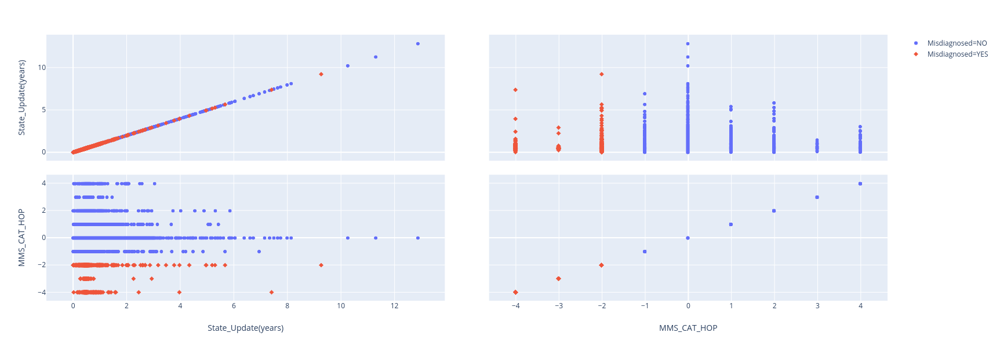

'plot_mms_cat_Misdiagnosed.html'

In [10]:
tmp_df = patient_com_treat_fea_raw_df[['State_Update(years)', 'MMS_CAT_HOP', 'Misdiagnosed']].dropna(how='any')

import plotly.express as px
fig = px.scatter_matrix(tmp_df,
    dimensions=["State_Update(years)", "MMS_CAT_HOP"],
    color="Misdiagnosed", symbol="Misdiagnosed")
fig.show()


fig.write_image("plot_mmshop_stateupdate_misdiagnosed.png", width=800, height=400, scale=3.0)
py.plot(fig,filename='plot_mmshop_stateupdate_misdiagnosed.html')



In [11]:
patient_com_treat_fea_raw_df['State_Update(0,2,4,6,8,10,12)'] =  patient_com_treat_fea_raw_df['State_Update(years)']//2
patient_com_treat_fea_raw_df[['State_Update(0,2,4,6,8,10,12)', 'MMS_CAT_HOP']].groupby(by=['MMS_CAT_HOP', 'State_Update(0,2,4,6,8,10,12)'])
# patient_cat_dur_id_pivot = patient_dur_mci_id.pivot(index='patient_id', columns='lineNumber', values='MINI_MENTAL_SCORE_CATEGORY(+MCI)')
patient_com_treat_fea_raw_df.head(5)

,patient_id,EPISODE_DATE,PETERSEN_MCI,MINI_MENTAL_SCORE,PSYCHIATRIC,MINI_MENTAL_SCORE_CATEGORY,lineNumber,durations(years),MINI_MENTAL_SCORE_CATEGORY(+MCI),State_Update(years),MMS_CAT_HOP,Misdiagnosed,"State_Update(0,2,4,6,8,10,12)"
0,1,1998-01-13,0.0,30.000000,0.0,Normal,1,0.000000,Normal,NaN,NaN,NaN,NaN
1,1,1998-12-14,0.0,29.833333,NaN,Normal,2,0.917808,Normal,0.917808,0.0,NO,0.0
2,1,2000-01-20,0.0,30.000000,9.0,Normal,3,2.019178,Normal,1.101370,0.0,NO,0.0
3,1,2000-08-18,9.0,29.833333,NaN,Normal,4,2.597260,Normal,0.578082,0.0,NO,0.0
4,1,2002-02-21,0.0,30.000000,NaN,Normal,5,4.109589,Normal,1.512329,0.0,NO,0.0


In [12]:
patient_dur_mci_id = patient_com_treat_fea_raw_df[['patient_id', 'Misdiagnosed', 'durations(years)']].dropna()
#patient_dur_mci_id['Misdiagnosed'].fillna('NO', inplace=True)
patient_cat_dur_id_pivot = patient_dur_mci_id.pivot(index='patient_id', columns='durations(years)', values='Misdiagnosed')
# patient_cat_dur_id_pivot.fillna(0, inplace=True)
# patient_cat_dur_id_pivot.replace(['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'],[20,40,60,80,100],inplace=True)
patient_cat_dur_id_pivot.replace(['NO', 'YES'],[0,100],inplace=True)
patient_cat_dur_id_pivot.interpolate(method='linear', axis=1, limit_area='inside',  inplace=True)
patient_cat_dur_id_pivot.sort_values(by=[i for i in patient_cat_dur_id_pivot.columns.values], inplace=True, ascending=True)
display(patient_cat_dur_id_pivot.head(5))

import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot.index.values]

line_patients = patient_cat_dur_id_pivot.columns.values

mms_values = patient_cat_dur_id_pivot.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=line_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.3, "y":0.8, "title":"Misdiagnosed: NO(0), YES(100)", 'titleside':'right'},
        showscale=True),
        layout=go.Layout(width=1300, height=6000, title='Patient misdiagnosed during years of treatment',xaxis_nticks=37,
                         xaxis={"title": "Duration(year)"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 6}, "tickangle": -10}))


#fig.show()

py.plot(fig,filename='plot_misdiagnos_duration_patientid_heatmap.html')


# Taking sample
# Taking only few patients for the plots
patient_cat_dur_id_pivot_sam = patient_cat_dur_id_pivot.sample(n=40, random_state=5)

import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot_sam.index.values]

line_patients = patient_cat_dur_id_pivot_sam.columns.values

mms_values = patient_cat_dur_id_pivot_sam.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=line_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.5, "y":0.5, "title":"Misdiagnosed: NO(0), YES(100)", 'titleside':'right'},
        showscale=True),
        layout=go.Layout(width=700, height=500, title='Patient misdiagnosed during years of treatment',xaxis_nticks=37,
                         xaxis={"title": "Duration(year)"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 7}, "tickangle": -10}))


#fig.show()
fig.write_image("plot_misdiagnos_duration_patientid_heatmap_sample.png", width=600, height=500, scale=3.0)
py.plot(fig,filename='plot_misdiagnos_duration_patientid_heatmap_sample.html')


durations(years)  0.002740  0.010959  0.027397  0.032877  0.057534  0.063014  \
patient_id                                                                     
1331              0.0       0.0       0.0       0.000000  0.000000  0.000000   
6713              0.0       0.0       0.0       0.000000  0.000000  0.000000   
5326             NaN        0.0       0.0       0.000000  0.000000  0.000000   
3597             NaN       NaN        0.0       0.000000  0.000000  0.000000   
4723             NaN       NaN        0.0       0.990099  1.980198  2.970297   

durations(years)  0.065753  0.079452  0.087671  0.093151   0.101370  \
patient_id                                                            
1331              0.000000  0.000000  0.000000  0.000000  0.000000    
6713              0.000000  0.000000  0.000000  0.000000  50.000000   
5326              0.000000  0.000000  0.000000  0.000000  0.000000    
3597              0.000000  0.000000  0.000000  0.000000  0.000000    
4723              3.960396  4.950495  5.940594  6.930693  7.920792    

durations(years)    0.106849   0.128767   0.134247   0.142466   0.147945  \
patient_id                                                                 
1331              0.000000    0.000000   0.000000   0.000000   0.000000    
6713              100.000000  93.333333  86.666667  80.000000  73.333333   
5326              0.000000    0.000000   0.000000   0.000000   0.000000    
3597              0.000000    0.000000   0.000000   0.000000   0.000000    
4723              8.910891    9.900990   10.891089  11.881188  12.871287   

durations(years)   0.153425   0.164384   0.167123   0.172603   0.178082  \
patient_id                                                                
1331              0.000000   0.000000   0.000000   0.000000   0.000000    
6713              66.666667  60.000000  53.333333  46.666667  40.000000   
5326              0.000000   0.000000   0.000000   0.000000   0.000000    
3597              0.000000   0.000000   0.000000   0.000000   0.000000    
4723              13.861386  14.851485  15.841584  16.831683  17.821782   

durations(years)   0.186301   0.189041   0.191781   0.194521   0.197260  \
patient_id                                                                
1331              0.000000   0.000000   0.000000   0.000000   0.000000    
6713              33.333333  26.666667  20.000000  13.333333  6.666667    
5326              0.000000   0.000000   0.000000   0.000000   0.000000    
3597              0.000000   0.000000   0.000000   0.000000   0.000000    
4723              18.811881  19.801980  20.792079  21.782178  22.772277   

durations(years)   0.208219   0.213699   0.216438   0.230137   0.238356  \
patient_id                                                                
1331              0.000000   0.000000   0.000000   0.000000   0.000000    
6713              0.000000   0.000000   0.000000   0.000000   0.000000    
5326              0.000000   0.000000   0.000000   0.000000   0.000000    
3597              0.000000   0.000000   0.000000   0.000000   0.000000    
4723              23.762376  24.752475  25.742574  26.732673  27.722772   

durations(years)   0.243836  0.254795   0.265753   0.273973   0.276712  \
patient_id                                                               
1331              0.000000   0.00000   0.000000   0.000000   0.000000    
6713              0.000000   0.00000   0.000000   0.000000   0.000000    
5326              0.000000   0.00000   0.000000   0.000000   0.000000    
3597              0.000000   0.00000   0.000000   0.000000   0.000000    
4723              28.712871  29.70297  30.693069  31.683168  32.673267   

durations(years)   0.282192   0.284932   0.293151   0.295890   0.298630  \
patient_id                                                                
1331              0.000000   0.000000   0.000000   0.000000   0.000000    
6713              0.000000   0.000000   0.000000   0.000000   0.000000    
5326       

'plot_mms_cat_misdiagnos_heatmap_sample.html'

In [13]:
patient_dur_mci_id = patient_com_treat_fea_raw_df[['patient_id', 'Misdiagnosed', 'lineNumber']].dropna()
#patient_dur_mci_id['Misdiagnosed'].fillna('NO', inplace=True)
patient_cat_dur_id_pivot = patient_dur_mci_id.pivot(index='patient_id', columns='lineNumber', values='Misdiagnosed')
# patient_cat_dur_id_pivot.fillna(0, inplace=True)
# patient_cat_dur_id_pivot.replace(['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'],[20,40,60,80,100],inplace=True)
patient_cat_dur_id_pivot.replace(['NO', 'YES'],[0,100],inplace=True)
patient_cat_dur_id_pivot.interpolate(method='linear', axis=1, limit_area='inside',  inplace=True)
patient_cat_dur_id_pivot.sort_values(by=[i for i in patient_cat_dur_id_pivot.columns.values], inplace=True, ascending=True)
display(patient_cat_dur_id_pivot.head(5))

import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot.index.values]

line_patients = patient_cat_dur_id_pivot.columns.values

mms_values = patient_cat_dur_id_pivot.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=line_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.3, "y":0.8, "title":"Misdiagnosed: NO(0), YES(100)", 'titleside':'right'},
        showscale=True),
        layout=go.Layout(width=1300, height=6000, title='Patient misdiagnosed during episodes',xaxis_nticks=37,
                         xaxis={"title": "Episode Number"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 6}, "tickangle": -10}))


#fig.show()

py.plot(fig,filename='plot_misdiagnos_episode_patientid_heatmap.html')


# Taking sample
# Taking only few patients for the plots
patient_cat_dur_id_pivot_sam = patient_cat_dur_id_pivot.sample(n=40, random_state=5)

import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot_sam.index.values]

line_patients = patient_cat_dur_id_pivot_sam.columns.values

mms_values = patient_cat_dur_id_pivot_sam.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=line_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.5, "y":0.5, "title":"Misdiagnosed: NO(0), YES(100)", 'titleside':'right'},
        showscale=True),
        layout=go.Layout(width=700, height=500, title='Patient misdiagnosed during episodes',xaxis_nticks=37,
                         xaxis={"title": "Episode Number"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 8}, "tickangle": -10}))


#fig.show()
fig.write_image("plot_misdiagnos_episode_patientid_heatmap_sample.png", width=600, height=600, scale=3.0)
py.plot(fig,filename='plot_misdiagnos_episode_patientid_heatmap_sample.html')


lineNumber,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37
patient_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3149,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
5042,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
5171,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
5363,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
2666,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


'plot_mms_cat_misdiagnos_episode_heatmap_sample.html'

In [14]:
patient_dur_mci_id = patient_com_treat_fea_raw_df[['patient_id', 'MINI_MENTAL_SCORE_CATEGORY(+MCI)', 'lineNumber']]
patient_cat_dur_id_pivot = patient_dur_mci_id.pivot(index='patient_id', columns='lineNumber', values='MINI_MENTAL_SCORE_CATEGORY(+MCI)')
#patient_cat_dur_id_pivot.fillna(0, inplace=True)
patient_cat_dur_id_pivot.replace(['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'],[20,40,60,80,100],inplace=True)
patient_cat_dur_id_pivot.interpolate(method='linear', axis=1, limit_area='inside',  inplace=True)
patient_cat_dur_id_pivot.sort_values(by=[i for i in patient_cat_dur_id_pivot.columns.values], inplace=True, ascending=False)
display(patient_cat_dur_id_pivot.head(5))

import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot.index.values]

line_patients = patient_cat_dur_id_pivot.columns.values

mms_values = patient_cat_dur_id_pivot.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=line_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.3, "y":0.80, "title":"MINI_MENTAL_SCORE_Category_Scale: Normal(20),NormalMCI(40),Mild(60),Moderate(80),Severe(100))", 'titleside':'right'},
        showscale=True),
        layout=go.Layout(width=1300, height=6000, title='MMSE progression of Patients',xaxis_nticks=37,
                         xaxis={"title": "Episode Number"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 6}, "tickangle": -10}))


#fig.show()

py.plot(fig,filename='plot_mmscat_episode_patientid_heatmap.html')

# Taking sample
# Taking only few patients for the plots
patient_cat_dur_id_pivot_sam = patient_cat_dur_id_pivot.sample(n=40, random_state=5)

import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot_sam.index.values]

line_patients = patient_cat_dur_id_pivot_sam.columns.values

mms_values = patient_cat_dur_id_pivot_sam.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=line_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.7, "y":0.50, "title":"MMS_Scale: Normal(20),NormalMCI(40),Mild(60),Moderate(80),Severe(100)", 'titleside':'right',"titlefont": {"size": 10} },
        showscale=True),
        layout=go.Layout(width=700, height=500, title='MMSE progression of Patients',xaxis_nticks=37,
                         xaxis={"title": "Episode Number"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 7}, "tickangle": -10}))


#fig.show()
fig.write_image("plot_mmscat_episode_patientid_heatmapp_sample.png", width=600, height=600, scale=3.0)
py.plot(fig,filename='plot_mmscat_episode_patientid_heatmap_sample.html')




lineNumber,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37
patient_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5363,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,NaN,NaN,NaN,NaN,NaN
2666,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN
3273,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6228,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3596,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'plot_mms_cat_episode_heatmap_sample.html'

In [15]:
patient_com_treat_fea_raw_df['durations_round(years)']= round(patient_com_treat_fea_raw_df['durations(years)'], 4)
#patient_com_treat_fea_raw_df['durations_round(years)'] = patient_com_treat_fea_raw_df['durations(years)']
patient_dur_mci_id = patient_com_treat_fea_raw_df[['patient_id', 'MINI_MENTAL_SCORE_CATEGORY(+MCI)', 'durations_round(years)']]
# patient_dur_mci_id.drop_duplicates(subset=['patient_id', 'durations_round(years)'],inplace=True)
# display(patient_dur_mci_id[patient_dur_mci_id.duplicated(subset=['patient_id', 'durations_round(years)'])]['patient_id'].unique().shape)
patient_cat_dur_id_pivot = patient_dur_mci_id.pivot(index='patient_id', columns='durations_round(years)', values='MINI_MENTAL_SCORE_CATEGORY(+MCI)')
#patient_cat_dur_id_pivot.fillna(0, inplace=True)
#patient_cat_dur_id_pivot.fillna(method='bfill' , inplace=True, axis=1)
patient_cat_dur_id_pivot.replace(['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'],[20,40,60,80,100],inplace=True)
patient_cat_dur_id_pivot.interpolate(method='linear', axis=1, limit_area='inside',  inplace=True)
patient_cat_dur_id_pivot.sort_values(by=[i for i in patient_cat_dur_id_pivot.columns.values], inplace=True, ascending=False)
patient_cat_dur_id_pivot_col = patient_cat_dur_id_pivot # patient_cat_dur_id_pivot[patient_cat_dur_id_pivot.columns.tolist()[-2:]+patient_cat_dur_id_pivot.columns.tolist()[0:-2]]
display(patient_cat_dur_id_pivot_col.iloc[400:420])

import datetime
import numpy as np
import plotly.graph_objs as go

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot_col.index.values]

duration_patients = patient_cat_dur_id_pivot_col.columns.values

mms_values = patient_cat_dur_id_pivot_col.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=duration_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.1, "y":0.80, "title":"MINI_MENTAL_SCORE_Category_Scale_(N/A(0),Normal(20),NormalMCI(40),Mild(60),Moderate(80),Severe(100))", 'titleside':'right'},
        showscale=True),
        layout=go.Layout(width=1300, height=6000, title='MMSE progression of Patients',xaxis_nticks=48,
                         xaxis={"title": "Duration(years)"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 6}, "tickangle": -10}))


#fig.show()

py.plot(fig,filename='plot_mmscat_duration_patientid_heatmap.html')


# Taking sample
# Taking only few patients for the plots
patient_cat_dur_id_pivot_sam = patient_cat_dur_id_pivot.sample(n=40, random_state=5)

import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot_sam.index.values]

duration_patients = patient_cat_dur_id_pivot_sam.columns.values

mms_values = patient_cat_dur_id_pivot_sam.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=duration_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.7, "y":0.50, "title":"MMS_Scale: Normal(20),NormalMCI(40),Mild(60),Moderate(80),Severe(100)", 'titleside':'right',"titlefont": {"size": 10} },
        showscale=True),
        layout=go.Layout(width=700, height=500, title='MMSE progression of Patients',xaxis_nticks=37,
                         xaxis={"title": "Duration (years)"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 7}, "tickangle": -10}))


#fig.show()
fig.write_image("plot_mmscat_duration_patientid_heatmap_sample.png", width=600, height=600, scale=3.0)
py.plot(fig,filename='plot_mmscat_duration_patientid_heatmap_sample.html')


durations_round(years)  0.0000     0.0027     0.0110     0.0274     0.0329  \
patient_id                                                                   
8597                    60.0   NaN        NaN        NaN        NaN          
8665                    60.0   NaN        NaN        NaN        NaN          
8719                    60.0   NaN        NaN        NaN        NaN          
2898                    40.0    42.500000  45.000000  47.500000  50.000000   
8733                    40.0    40.909091  41.818182  42.727273  43.636364   
8737                    40.0    40.882353  41.764706  42.647059  43.529412   
8698                    40.0    40.461538  40.923077  41.384615  41.846154   
8696                    40.0    40.454545  40.909091  41.363636  41.818182   
8695                    40.0    40.454545  40.909091  41.363636  41.818182   
2221                    40.0    40.451128  40.902256  41.353383  41.804511   
8694                    40.0    40.431655  40.863309  41.294964  41.726619   
3025                    40.0    40.430108  40.860215  41.290323  41.720430   
8364                    40.0    40.400000  40.800000  41.200000  41.600000   
5910                    40.0    40.298507  40.597015  40.895522  41.194030   
4691                    40.0    40.241935  40.483871  40.725806  40.967742   
3431                    40.0    40.235294  40.470588  40.705882  40.941176   
3421                    40.0    40.202020  40.404040  40.606061  40.808081   
6304                    40.0    40.186916  40.373832  40.560748  40.747664   
1880                    40.0    40.185185  40.370370  40.555556  40.740741   
8742                    40.0    40.185185  40.370370  40.555556  40.740741   

durations_round(years)     0.0466     0.0575     0.0630     0.0658     0.0795  \
patient_id                                                                      
8597                   NaN        NaN        NaN        NaN        NaN          
8665                   NaN        NaN        NaN        NaN        NaN          
8719                   NaN        NaN        NaN        NaN        NaN          
2898                    52.500000  55.000000  57.500000  60.000000  62.500000   
8733                    44.545455  45.454545  46.363636  47.272727  48.181818   
8737                    44.411765  45.294118  46.176471  47.058824  47.941176   
8698                    42.307692  42.769231  43.230769  43.692308  44.153846   
8696                    42.272727  42.727273  43.181818  43.636364  44.090909   
8695                    42.272727  42.727273  43.181818  43.636364  44.090909   
2221                    42.255639  42.706767  43.157895  43.609023  44.060150   
8694                    42.158273  42.589928  43.021583  43.453237  43.884892   
3025                    42.150538  42.580645  43.010753  43.440860  43.870968   
8364                    42.000000  42.400000  42.800000  43.200000  43.600000   
5910                    41.492537  41.791045  42.089552  42.388060  42.686567   
4691                    41.209677  41.451613  41.693548  41.935484  42.177419   
3431                    41.176471  41.411765  41.647059  41.882353  42.117647   
3421                    41.010101  41.212121  41.414141  41.616162  41.818182   
6304                    40.934579  41.121495  41.308411  41.495327  41.682243   
1880                    40.925926  41.111111  41.296296  41.481481  41.666667   
8742                    40.925926  41.111111  41.296296  41.481481  41.666667   

durations_round(years)     0.0877     0.0932     0.1014     0.1041     0.1068  \
patient_id                                                                      
8597                   NaN        NaN        NaN        NaN        NaN          
8665                   NaN        NaN        NaN        NaN        NaN          
8719                   NaN        NaN        NaN        NaN        NaN          
2898                    65.000000  67.500000  70.000000  72.500000  75.000000   
8733          

'plot_mms_cat_duration_heatmap_sample.html'

In [16]:
def get_patient_state(l):
    # find constant
    if len(set(l))==1:
        return 'C_'+ str(l[0])
    else:
        return 'NC_'

def get_patient_st1_st2_min(l):
    t = []
    for i in range(len(l)-1):
        t.append(l[i+1]-l[i])
    if len(t)>=1:
        return min(t)    

def get_patient_st1_st2_max(l):
    t = []
    for i in range(len(l)-1):
        t.append(l[i+1]-l[i])
    if len(t)>=1:
        return max(t)    

    
#patient_com_treat_fea_raw_df['patient_state'] = #['PSYCHIATRIC','MINI_MENTAL_SCORE_CATEGORY(+MCI)'].transform(lambda x: x)
patient_com_treat_fea_raw_agg_list_df = patient_com_treat_fea_raw_df.replace(['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'],[1.0,2.0,3.0,4.0,5.0])\
                            .groupby(by=['patient_id']).agg(lambda x : x.tolist())


patient_com_treat_fea_raw_agg_list_df['STATE_CONSTANT']= patient_com_treat_fea_raw_agg_list_df['MINI_MENTAL_SCORE_CATEGORY(+MCI)'].apply(get_patient_state)
patient_com_treat_fea_raw_agg_list_df['ST1_ST2_MIN']= patient_com_treat_fea_raw_agg_list_df['MINI_MENTAL_SCORE_CATEGORY(+MCI)'].apply(get_patient_st1_st2_min)
patient_com_treat_fea_raw_agg_list_df['ST1_ST2_MAX']= patient_com_treat_fea_raw_agg_list_df['MINI_MENTAL_SCORE_CATEGORY(+MCI)'].apply(get_patient_st1_st2_max)

display(patient_com_treat_fea_raw_agg_list_df.head(15))

,EPISODE_DATE,PETERSEN_MCI,MINI_MENTAL_SCORE,PSYCHIATRIC,MINI_MENTAL_SCORE_CATEGORY,lineNumber,durations(years),MINI_MENTAL_SCORE_CATEGORY(+MCI),State_Update(years),MMS_CAT_HOP,Misdiagnosed,"State_Update(0,2,4,6,8,10,12)",durations_round(years),STATE_CONSTANT,ST1_ST2_MIN,ST1_ST2_MAX
patient_id,,,,,,,,,,,,,,,,
1,"[1998-01-13 00:00:00, 1998-12-14 00:00:00, 2000-01-20 00:00:00, 2000-08-18 00:00:00, 2002-02-21 00:00:00, 2002-10-28 00:00:00, 2004-06-22 00:00:00, 2007-05-04 00:00:00]","[0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 0.0, 0.0]","[30.0, 29.833333333333332, 30.0, 29.833333333333332, 30.0, 29.0, 30.0, 30.0]","[0.0, nan, 9.0, nan, nan, nan, nan, nan]","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]","[1, 2, 3, 4, 5, 6, 7, 8]","[0.0, 0.9178082191780822, 2.0191780821917806, 2.5972602739726027, 4.109589041095891, 4.791780821917809, 6.443835616438356, 9.30958904109589]","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]","[nan, 0.9178082191780822, 1.1013698630136983, 0.5780821917808221, 1.5123287671232881, 0.6821917808219178, 1.6520547945205477, 2.865753424657534]","[nan, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[nan, NO, NO, NO, NO, NO, NO, NO]","[nan, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]","[0.0, 0.9178, 2.0192, 2.5973, 4.1096, 4.7918, 6.4438, 9.3096]",C_1.0,0.0,0.0
14,"[1990-03-26 00:00:00, 1991-05-23 00:00:00, 1992-04-28 00:00:00, 1993-04-07 00:00:00, 1994-04-14 00:00:00, 1995-04-27 00:00:00, 1996-03-18 00:00:00, 1997-03-27 00:00:00, 1998-04-16 00:00:00, 1999-03-19 00:00:00, 1999-06-16 00:00:00]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, nan]","[29.0, 30.0, 28.0, 29.0, 30.0, 30.0, 29.0, 30.0, 30.0, 30.0, 29.5]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, nan]","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]","[0.0, 1.158904109589041, 2.0931506849315067, 3.0356164383561643, 4.054794520547945, 5.090410958904109, 5.983561643835617, 7.008219178082192, 8.063013698630137, 8.986301369863014, 9.23013698630137]","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]","[nan, 1.158904109589041, 0.9342465753424656, 0.9424657534246577, 1.019178082191781, 1.035616438356164, 0.8931506849315074, 1.0246575342465754, 1.0547945205479445, 0.9232876712328775, 0.24383561643835527]","[nan, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[nan, NO, NO, NO, NO, NO, NO, NO, NO, NO, NO]","[nan, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0, 1.1589, 2.0932, 3.0356, 4.0548, 5.0904, 5.9836, 7.0082, 8.063, 8.9863, 9.2301]",C_1.0,0.0,0.0
16,"[1991-07-15 00:00:00, 1992-08-11 00:00:00, 1993-09-22 00:00:00, 1994-09-05 00:00:00, 1995-07-03 00:00:00, 1996-10-21 00:00:00, 1997-03-11 00:00:00]","[9.0, 9.0, 9.0, 9.0, 9.0, 9.0, nan]","[28.0, 25.0, 28.0, 25.0, 24.0, 26.0, 26.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 9.0, nan]","[1.0, 1.0, 1.0, 1.0, 3.0, 1.0, 1.0]","[1, 2, 3, 4, 5, 6, 7]","[0.0, 1.0767123287671232, 2.191780821917808, 3.1452054794520548, 3.96986301369863, 5.273972602739726, 5.66027397260274]","[1.0, 1.0, 1.0, 1.0, 3.0, 1.0, 1.0]","[nan, 1.0767123287671232, 1.115068493150685, 0.9534246575342467, 0.8246575342465752, 1.3041095890410963, 0.38630136986301356]","[nan, 0.0, 0.0, 0.0, 2.0, -2.0, 0.0]","[nan, NO, NO, NO, NO, YES, NO]","[nan, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","[0.0, 1.0767, 2.1918, 3.1452, 3.9699, 5.274, 5.6603]",NC_,-2.0,2.0
19,"[1989-09-27 00:00:00, 1990-03-27 00:00:00, 1990-09-17 00:00:00, 1991-04-12 00:00:00, 1991-11-12 00:00:00, 1992-05-20 00:00:00, 1992-11-10 00:00:00, 1993-05-19 00:00:00, 1993-11-23 00:00:00, 1994-05-23 00:00:00, 1994-07-06 00:00:00]","[0.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, nan]","[12.0, 14.0, 15.0, 5.0, 7.0, 6.0, 0.0, 0.0, 0.0, -1.0, -1.0]","[1.0, 1.0, 1.0, 9.0, 1.0, 9.0, 1.0, 9.0, 1.0, 9.0, nan]","[5.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0]","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]","[0.0, 0.4958904109589041, 0.9726027397260274, 1.5397260273972602, 2.126027397260274, 2.6465753424657534, 3.1232876712328768, 3.643835616438356, 4.158904109589041, 4.654794520547945, 4.775

In [18]:
# Non Constant Patients

patient_com_treat_fea_raw_df['durations_round(years)']= round(patient_com_treat_fea_raw_df['durations(years)'], 4)
#patient_com_treat_fea_raw_df['durations_round(years)'] = patient_com_treat_fea_raw_df['durations(years)']

# Filter Non Constant Patients (Normal and Severe)
filter_df = patient_com_treat_fea_raw_agg_list_df[~(patient_com_treat_fea_raw_agg_list_df['STATE_CONSTANT'].isin(['C_1.0', 'C_5.0', 'C_nan']))]
display(filter_df[filter_df['ST1_ST2_MAX']>=2].shape)
display(filter_df[filter_df['ST1_ST2_MIN']<=-2].shape)
display(filter_df.shape)
#display(patient_com_treat_fea_raw_df[filter_df.index])
patient_dur_mci_id = patient_com_treat_fea_raw_df[patient_com_treat_fea_raw_df['patient_id'].isin(filter_df.index)][['patient_id', 'MINI_MENTAL_SCORE_CATEGORY(+MCI)', 'durations_round(years)']]
display(patient_dur_mci_id.shape)
#patient_dur_mci_id.drop_duplicates(subset=['patient_id', 'durations_round(years)'],inplace=True)
#display(patient_dur_mci_id[patient_dur_mci_id.duplicated(subset=['patient_id', 'durations_round(years)'])]['patient_id'].unique().shape)
patient_cat_dur_id_pivot = patient_dur_mci_id.pivot(index='patient_id', columns='durations_round(years)', values='MINI_MENTAL_SCORE_CATEGORY(+MCI)')
display(patient_cat_dur_id_pivot.shape)
#patient_cat_dur_id_pivot.fillna(0, inplace=True)
#patient_cat_dur_id_pivot.fillna(method='bfill' , inplace=True, axis=1)
patient_cat_dur_id_pivot.replace(['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'],[20.0,40.0,60.0,80.0,100.0],inplace=True)
#patient_cat_dur_id_pivot = patient_cat_dur_id_pivot.astype('float64')
patient_cat_dur_id_pivot.interpolate(method='linear', axis=1, limit_area='inside',  inplace=True)
patient_cat_dur_id_pivot.sort_values(by=[i for i in patient_cat_dur_id_pivot.columns.values], inplace=True, ascending=False)
patient_cat_dur_id_pivot.dropna(axis=0, how='all', inplace=True)
# patient_cat_dur_id_pivot[-1]=0.0
# patient_cat_dur_id_pivot[-2]=50.0
patient_cat_dur_id_pivot_col = patient_cat_dur_id_pivot # [patient_cat_dur_id_pivot.columns.tolist()[-2:]+patient_cat_dur_id_pivot.columns.tolist()[0:-2]]
display(patient_cat_dur_id_pivot_col.iloc[400:420])

import datetime
import numpy as np
import plotly.graph_objs as go

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot_col.index.values]

duration_patients = patient_cat_dur_id_pivot_col.columns.values

mms_values = patient_cat_dur_id_pivot_col.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=duration_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.1, "y":0.80, "title":"MINI_MENTAL_SCORE_Category_Scale_(N/A(0),Normal(20),NormalMCI(40),Mild(60),Moderate(80),Severe(100))", 'titleside':'right'},
        showscale=True),
        layout=go.Layout(width=1300, height=4000, title='MMSE progression of Patients',xaxis_nticks=48,
                         xaxis={"title": "Duration(years)"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 6}, "tickangle": -10}))


#fig.show()

py.plot(fig,filename='plot_mmscat_duration_patientid_noconstant_heatmap.html')


# Taking sample
# Taking only few patients for the plots
patient_cat_dur_id_pivot_sam = patient_cat_dur_id_pivot.sample(n=40, random_state=5)

import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot_sam.index.values]

duration_patients = patient_cat_dur_id_pivot_sam.columns.values

mms_values = patient_cat_dur_id_pivot_sam.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=duration_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.7, "y":0.50, "title":"MMS_Scale: Normal(20),NormalMCI(40),Mild(60),Moderate(80),Severe(100)", 'titleside':'right',"titlefont": {"size": 10} },
        showscale=True),
        layout=go.Layout(width=700, height=500, title='MMSE progression of Patients',xaxis_nticks=37,
                         xaxis={"title": "Duration (years)"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 7}, "tickangle": -10}))


#fig.show()
fig.write_image("plot_mmscat_duration_patientid_noconstant_heatmap_sample.png", width=600, height=600, scale=3.0)
py.plot(fig,filename='plot_mmscat_duration_patientid_noconstant_heatmap_sample.html')



(402, 16)

(305, 16)

(676, 16)

(6965, 3)

(676, 2867)

durations_round(years)  0.0000     0.0027     0.0274     0.0329     0.0466  \
patient_id                                                                   
6499                    20.0    20.472441  20.944882  21.417323  21.889764   
6509                    20.0    20.465116  20.930233  21.395349  21.860465   
7723                    20.0    20.459770  20.919540  21.379310  21.839080   
6144                    20.0    20.457143  20.914286  21.371429  21.828571   
270                     20.0    20.454545  20.909091  21.363636  21.818182   
4580                    20.0    20.444444  20.888889  21.333333  21.777778   
1345                    20.0    20.439560  20.879121  21.318681  21.758242   
6749                    20.0    20.439560  20.879121  21.318681  21.758242   
2335                    20.0    20.430108  20.860215  21.290323  21.720430   
7643                    20.0    20.416667  20.833333  21.250000  21.666667   
8648                    20.0    20.412371  20.824742  21.237113  21.649485   
135                     20.0    20.404040  20.808081  21.212121  21.616162   
2993                    20.0    20.404040  20.808081  21.212121  21.616162   
7140                    20.0    20.402010  20.804020  21.206030  21.608040   
3999                    20.0    20.384615  20.769231  21.153846  21.538462   
4114                    20.0    20.377358  20.754717  21.132075  21.509434   
2851                    20.0    20.377358  20.754717  21.132075  21.509434   
4467                    20.0    20.368664  20.737327  21.105991  21.474654   
861                     20.0    20.360360  20.720721  21.081081  21.441441   
6828                    20.0    20.357143  20.714286  21.071429  21.428571   

durations_round(years)     0.0575     0.0658     0.0795     0.0932     0.1041  \
patient_id                                                                      
6499                    22.362205  22.834646  23.307087  23.779528  24.251969   
6509                    22.325581  22.790698  23.255814  23.720930  24.186047   
7723                    22.298851  22.758621  23.218391  23.678161  24.137931   
6144                    22.285714  22.742857  23.200000  23.657143  24.114286   
270                     22.272727  22.727273  23.181818  23.636364  24.090909   
4580                    22.222222  22.666667  23.111111  23.555556  24.000000   
1345                    22.197802  22.637363  23.076923  23.516484  23.956044   
6749                    22.197802  22.637363  23.076923  23.516484  23.956044   
2335                    22.150538  22.580645  23.010753  23.440860  23.870968   
7643                    22.083333  22.500000  22.916667  23.333333  23.750000   
8648                    22.061856  22.474227  22.886598  23.298969  23.711340   
135                     22.020202  22.424242  22.828283  23.232323  23.636364   
2993                    22.020202  22.424242  22.828283  23.232323  23.636364   
7140                    22.010050  22.412060  22.814070  23.216080  23.618090   
3999                    21.923077  22.307692  22.692308  23.076923  23.461538   
4114                    21.886792  22.264151  22.641509  23.018868  23.396226   
2851                    21.886792  22.264151  22.641509  23.018868  23.396226   
4467                    21.843318  22.211982  22.580645  22.949309  23.317972   
861                     21.801802  22.162162  22.522523  22.882883  23.243243   
6828                    21.785714  22.142857  22.500000  22.857143  23.214286   

durations_round(years)     0.1068     0.1342     0.1671     0.1726     0.1781  \
patient_id                                                                      
6499                    24.724409  25.196850  25.669291  26.141732  26.614173   
6509                    24.651163  25.116279  25.581395  26.046512  26.511628   
7723                    24.597701  25.057471  25.517241  25.977011  26.436782   
6144                    24.571429  25.028571  25.485714  25.942857  26.400000   
270           

'plot_mms_cat_duration_heatmap_noconstant_sample.html'

In [ ]:
#Categorising patient based in their progression
patient_com_treat_fea_raw_df['durations_round(years)']= round(patient_com_treat_fea_raw_df['durations(years)'], 3)
#patient_com_treat_fea_raw_df['durations_round(years)'] = patient_com_treat_fea_raw_df['durations(years)']
patient_dur_mci_id = patient_com_treat_fea_raw_df[['patient_id', 'MINI_MENTAL_SCORE_CATEGORY(+MCI)', 'durations_round(years)']]
patient_dur_mci_id.drop_duplicates(subset=['patient_id', 'durations_round(years)'],inplace=True)
display(patient_dur_mci_id[patient_dur_mci_id.duplicated(subset=['patient_id', 'durations_round(years)'])]['patient_id'].unique().shape)
patient_cat_dur_id_pivot = patient_dur_mci_id.pivot(index='patient_id', columns='durations_round(years)', values='MINI_MENTAL_SCORE_CATEGORY(+MCI)')
#patient_cat_dur_id_pivot.fillna(0, inplace=True)
patient_cat_dur_id_pivot.fillna(method='bfill' , inplace=True, axis=1)
patient_cat_dur_id_pivot.replace(['Normal', 'NormalMCI','Mild', 'Moderate', 'Severe'],[20,40,60,80,100],inplace=True)
patient_cat_dur_id_pivot.sort_values(by=[i for i in patient_cat_dur_id_pivot.columns.values], inplace=True, ascending=False)
display(patient_cat_dur_id_pivot.iloc[400:420])

'''import datetime
import numpy as np
import plotly.graph_objs as go
np.random.seed(1)

patient_ids = ["P_ID:"+str(i) for i in patient_cat_dur_id_pivot.index.values]

duration_patients = patient_cat_dur_id_pivot.columns.values

mms_values = patient_cat_dur_id_pivot.values

fig = go.Figure(data=go.Heatmap(
        z=mms_values,
        x=duration_patients,
        y=patient_ids,
        colorscale='Viridis', 
        colorbar={"len":0.3, "y":0.80, "title":"MINI_MENTAL_SCORE_Category_Scale_(N/A(0),Normal(20),NormalMCI(40),Mild(60),Moderate(80),Severe(100))", 'titleside':'right'},
        showscale=True),
        layout=go.Layout(width=1300, height=6000, title='MMSE progression of Patients',xaxis_nticks=37,
                         xaxis={"title": "Duration(years)"},
                         yaxis={"title": "Patient_ids", "tickvals":patient_ids, "ticktext":patient_ids,"tickfont": {"size": 6}, "tickangle": -10}))


fig.show()

py.plot(fig,filename='plot_mms_cat_patients_train_heatmap.html')'''

In [ ]:
patient_dur_mci_id_normal = patient_dur_mci_id[patient_dur_mci_id.columns[(patient_dur_mci_id.iloc[0:1,0:]=='Normal').values.flatten()]]
fig = go.Figure([{
    'x': patient_dur_mci_id_normal[col].dropna().index,
    'y': patient_dur_mci_id_normal[col].dropna(),
    'name': col
}  for col in patient_dur_mci_id_normal.columns])
#py.iplot()

py.plot(fig,filename='plot_mms_cat_frst_last_duration_normal.html')

In [ ]:
#patient_com_treat_fea_raw_df['durations(years)'] = 
# patient_com_treat_fea_raw_df.drop(columns=['mms_cat_containing_normal_mci_frst', 'mms_cat_containing_normal_mci_lst'], inplace=True)
patient_com_treat_fea_raw_df['mms_cat_containing_normal_mci_frst']=patient_com_treat_fea_raw_df.groupby(by=['patient_id'])['mms_cat_containing_normal_mci'].transform(lambda x : x.iloc[0])
patient_com_treat_fea_raw_df['mms_cat_containing_normal_mci_lst']=patient_com_treat_fea_raw_df.groupby(by=['patient_id'])['mms_cat_containing_normal_mci'].transform(lambda x : x.iloc[-1])
patient_com_treat_fea_raw_df['mms_cat_frst_last'] = patient_com_treat_fea_raw_df[['mms_cat_containing_normal_mci_frst', 'mms_cat_containing_normal_mci_lst']].agg(lambda x : str(x[0])+'_'+str(x[1]), axis=1)
data_mms_cat_frst_last = patient_com_treat_fea_raw_df[['patient_id', 'mms_cat_frst_last', 'mms_cat_containing_normal_mci_frst']][patient_com_treat_fea_raw_df.mms_cat_frst_last != 'nan_nan'].drop_duplicates()
data_mms_cat_frst_last.sort_values('mms_cat_frst_last', inplace=True)
fig = px.histogram(data_mms_cat_frst_last, x="mms_cat_frst_last")
fig.show()
py.plot(fig,filename='plot_mms_cat_frst_last.html')

In [ ]:

l= ['Categories']+data_mms_cat_frst_last.mms_cat_frst_last.unique().tolist() + data_mms_cat_frst_last.mms_cat_containing_normal_mci_frst.unique().tolist()
p = [''] + [i.split('_')[0] for i in data_mms_cat_frst_last.mms_cat_frst_last.unique()] + ['Categories' for i in data_mms_cat_frst_last.mms_cat_containing_normal_mci_frst.unique()]
mms_cat_frst_last_count = dict(data_mms_cat_frst_last.mms_cat_frst_last.value_counts())
mms_cat_containing_normal_mci_frst_count = dict(data_mms_cat_frst_last.mms_cat_containing_normal_mci_frst.value_counts())
mms_cat_fl_dict_total = {**mms_cat_frst_last_count, **mms_cat_containing_normal_mci_frst_count}
v = [sum(mms_cat_frst_last_count.values())] + [mms_cat_fl_dict_total[i] for i in l if i in mms_cat_fl_dict_total]
#v = [(i,i/sum(mms_cat_frst_last_count.values())*100) for i in v ]
print (l, len(l))
print (p, len(p))
print (v, len(v))

fig =go.Figure(go.Sunburst(
    labels=l,
    parents=p,
    values= v,
    hovertext=[(str(j)+' '+'Count: '+str(i), 'Percentage: '+str(i/sum(mms_cat_frst_last_count.values())*100)) for i,j in zip(v,l)],
    hoverinfo="text",
    branchvalues="total",
))

fig.update_layout(title=go.layout.Title(text='Figure'), margin = dict(t=100, l=0, r=100, b=0))
py.plot(fig,filename='plot_mms_cat_frst_last_sunbur.html')
fig.show()

In [ ]:
# plot MMSE Category VS Episode Number for each patient   # lets select patient based on his intial condition
# sort categorical data 
from pandas.api.types import CategoricalDtype
cat_type = CategoricalDtype(categories=['Normal', 'Mild', 'Moderate', 'Severe'], ordered=True)

patient_cat_line_id = patient_com_treat_fea_raw_df[['patient_id', 'MINI_MENTAL_SCORE_CATEGORY', 'lineNumber']]
display(patient_cat_line_id.head(5))
patient_cat_line_id['MINI_MENTAL_SCORE_CATEGORY'] = patient_cat_line_id['MINI_MENTAL_SCORE_CATEGORY'].astype(cat_type)
patient_cat_line_id.sort_values(by=['MINI_MENTAL_SCORE_CATEGORY'], inplace=True)
patient_cat_line_id_pivot = patient_cat_line_id.pivot(index='lineNumber', columns='patient_id', values='MINI_MENTAL_SCORE_CATEGORY')
py.iplot([{
    'x': patient_cat_line_id_pivot.index,
    'y': patient_cat_line_id_pivot[col],
    'name': col
}  for col in patient_cat_line_id_pivot.columns], filename='./patient_cat_line_id_pivot')

In [ ]:
patient_com_treat_fea_raw_df['durations(years)'] = patient_com_treat_fea_raw_df.groupby(by=['patient_id'])['EPISODE_DATE'].transform(lambda x: (x - x.iloc[0])/(np.timedelta64(1, 'D')*365.25))

patient_cat_dur_id = patient_com_treat_fea_raw_df[['patient_id', 'MINI_MENTAL_SCORE_CATEGORY', 'durations(years)']]
display(patient_cat_dur_id.head(5))
patient_cat_dur_id['MINI_MENTAL_SCORE_CATEGORY'] = patient_cat_dur_id['MINI_MENTAL_SCORE_CATEGORY'].astype(cat_type)
patient_cat_dur_id.sort_values(by=['MINI_MENTAL_SCORE_CATEGORY'], inplace=True)
patient_cat_dur_id_pivot = patient_cat_dur_id.pivot(index='durations(years)', columns='patient_id', values='MINI_MENTAL_SCORE_CATEGORY')

py.iplot([{
    'x': patient_cat_dur_id_pivot[col].dropna().index,
    'y': patient_cat_dur_id_pivot[col].dropna(),
    'name': col
}  for col in patient_cat_dur_id_pivot.columns], filename='./patient_cat_dur_id_pivot')


# import math 
# max_val  = math.ceil(max(patient_com_treat_fea_raw_df['durations(years)']))
# pd.cut(patient_com_treat_fea_raw_df['durations(years)'], bins=[-1,1,3,7, max_val], labels=[1,3,7, max_val]) #labels=['20s', '30s', '40s']

In [ ]:
patient_com_treat_fea_raw_df['durations(years)'] = patient_com_treat_fea_raw_df.groupby(by=['patient_id'])['EPISODE_DATE'].transform(lambda x: (x - x.iloc[0])/(np.timedelta64(1, 'D')*365.25))
patient_com_treat_fea_raw_df['initial_state'] = patient_com_treat_fea_raw_df.groupby(by=['patient_id'])['MINI_MENTAL_SCORE_CATEGORY'].transform(lambda x: x.iloc[0])
display(patient_com_treat_fea_raw_df.head(5))

# select patient based on intial state
def plot_duration_mmse_category(df):
    patient_cat_dur_id = df[['patient_id', 'MINI_MENTAL_SCORE_CATEGORY', 'durations(years)']]
    display(patient_cat_dur_id.head(5))
    patient_cat_dur_id['MINI_MENTAL_SCORE_CATEGORY'] = patient_cat_dur_id['MINI_MENTAL_SCORE_CATEGORY'].astype(cat_type)
    patient_cat_dur_id.sort_values(by=['MINI_MENTAL_SCORE_CATEGORY'], inplace=True)
    #patient_cat_dur_id.replace(['Normal', 'Mild', 'Moderate', 'Severe'], [0,1,2,3], inplace=True)
    #display(patient_cat_dur_id.head(10))
    patient_cat_dur_id_pivot = patient_cat_dur_id.pivot(index='durations(years)', columns='patient_id', values='MINI_MENTAL_SCORE_CATEGORY')
    #print (patient_cat_dur_id_pivot[col].dropna())
    py.iplot([{
        'x': patient_cat_dur_id_pivot[col].dropna().index,
        'y': patient_cat_dur_id_pivot[col].dropna(),
        'name': col
    }  for col in patient_cat_dur_id_pivot.columns], filename='./patient_cat_dur_id_pivot')



# for normal patients
plot_duration_mmse_category(patient_com_treat_fea_raw_df[patient_com_treat_fea_raw_df['initial_state']=='Normal'])
plot_duration_mmse_category(patient_com_treat_fea_raw_df[patient_com_treat_fea_raw_df['initial_state']=='Mild'])
plot_duration_mmse_category(patient_com_treat_fea_raw_df[patient_com_treat_fea_raw_df['initial_state']=='Moderate'])


In [ ]:
# Take only 10 episodes of the patients
'''fltr_linnum = ['_'+str(i) for i in range(10, 27)]
print (fltr_linnum)
patient_com_treat_fea_raw_df.drop(columns=[col for col in patient_com_treat_fea_raw_df.columns for i in fltr_linnum if i in col], inplace=True)
patient_com_treat_fea_raw_df = patient_com_treat_fea_raw_df.drop([col for col in patient_com_treat_fea_raw_df.columns if 'lineNumber' in col], axis=1).reset_index(drop=True)
#Saving extended episode of each patients
patient_com_treat_fea_raw_df.to_csv(data_path + 'patient_com_treat_fea_episode_0_9_raw_df.csv', index=False)'''


In [ ]:
patient_com_treat_fea_raw_df[['patient_id']+[col for col in patient_com_treat_fea_raw_df.columns if 'EPISODE_DATE' in col or 'MINI_MENTAL_SCORE_CATEGORY' in col]].head(10)

## <a id='01.2'>1.2. Prepare data  </a>

In [ ]:
# Merging Treatment and comorbidities dataframe from API to Patients
'''patient_df = patient_df.merge(patient_combor_list_df[['patient_id', 'disorderName_cui']], on='patient_id', how='left')
patient_df = patient_df.merge(patient_treatmn_list_df[['patient_id', 'drugName_cui']], on='patient_id', how='left')
display(patient_df.head(5))

# Converting all columns containing list data of Patients into separte columns
columns_list = ['disorderName_cui', 'drugName_cui']
classeslist = [patient_combor_list, patient_treatmn_list]
featuretransform = FeatureTransform(patient_df)
patient_df = [featuretransform.apply_feature_transform(column_name=col, func_type='multiLabel', classes=clss, data_type_func='ordinal', literal=False) for col, clss in zip(columns_list, classeslist)][-1]

patient_df.head(1)'''


# Merging selected features from raw data dataframe to Patients
patient_df = patient_df.merge(patient_com_treat_fea_raw_df, on='patient_id', how='left')
display(patient_df.head(5))



In [ ]:
# Transform list data to individual columns
featuretransform = FeatureTransform(patient_df)
classes_list = [list(featuretransform.extract_value_frm_list(patient_df[col].dropna().tolist())) 
                for col in patient_df.columns if 'Comorbidity_cui' in col or 'Medication_cui' in col]
columns_list = [col for col in patient_df.columns if 'Comorbidity_cui' in col or 'Medication_cui' in col]

patient_df = [featuretransform.apply_feature_transform(column_name=col, func_type='multiLabel', classes=clss, data_type_func='ordinal', literal=False) 
 for col, clss in zip(columns_list, classes_list)][-1]

# Calculate maximum episodes for patients
patient_df['Max_EPISODE']  = np.argmax(np.asarray([((patient_df[col] - patient_df['EPISODE_DATE'])/np.timedelta64(1, 'D'))/365.25
     for col in patient_df.columns if 'EPISODE_DATE' in col]), axis=0)

# Calculate Final Episode Date-First Episode date difference
patient_df['EPISODE_Duration(Years)']  = np.nanmax(np.asarray([((patient_df[col] - patient_df['EPISODE_DATE'])/np.timedelta64(1, 'D'))/365.25
     for col in patient_df.columns if 'EPISODE_DATE' in col]), axis=0)


# Calculate last episode MMSE Category
x_all_mmmse_ep_array = np.asarray([patient_df[col] for col in patient_df.columns if 'MINI_MENTAL_SCORE_CATEGORY' in col])

patient_df['Last_EPISODE_MMSE_Category']  = x_all_mmmse_ep_array[[r-1 for r in patient_df['Max_EPISODE']],[c for c in range(x_all_mmmse_ep_array.shape[1])]]

# saving complete prepocessed file
patient_df.to_csv(data_path+'patient_df_complete.csv', index=False)

In [ ]:
patient_df.head(5)

In [ ]:
#x,y = zip(patient_df['EPISODE_Duration(Years)'], patient_df['Max_EPISODE'])
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt 
ax = sns.scatterplot(x="EPISODE_Duration(Years)", y="Max_EPISODE", data=patient_df[['EPISODE_Duration(Years)', 'Max_EPISODE']])
plt.savefig(result_path+'ep_years.png', dpi=120)

## <a id='01.3'>1.3. Prepare target </a>

In [ ]:
def calculate_class(patient_df, mmseInicialDiscretized, mmseFinalDiscretized, time1, time2, label):
    #return np.where((patient_df['mmseInicialDiscretized']==mmseInicialDiscretized) & (patient_df['mmseFinalDiscretized']==mmseFinalDiscretized) 
    #                & (patient_df['epDateFinal-epDateInicial(year)']>=time1) & (patient_df['epDateFinal-epDateInicial(year)']<time2), label, 9)  # largest value for class+1 = 3
    patient_df.loc[(patient_df['MINI_MENTAL_SCORE_CATEGORY']==mmseInicialDiscretized) 
                   & (patient_df['Last_EPISODE_MMSE_Category']==mmseFinalDiscretized) 
                   & (patient_df['EPISODE_Duration(Years)']>=time1) 
                   & (patient_df['EPISODE_Duration(Years)']<time2), 'patient_class_cat'] = label

# Intialize with 'Unknown'
patient_df['patient_class_cat'] = 'Unknown'

# normal, mild, moderate, severe
calculate_class(patient_df, 'Mild', 'Moderate', 0, 2, 'Fast')
calculate_class(patient_df, 'Mild', 'Moderate', 2, 4, 'Normal')
calculate_class(patient_df, 'Mild', 'Moderate', 4, max(patient_df['EPISODE_Duration(Years)'])+1, 'Slow')
calculate_class(patient_df, 'Moderate', 'Severe', 0, 3, 'Fast')
calculate_class(patient_df, 'Moderate', 'Severe', 3, 5, 'Normal')
calculate_class(patient_df, 'Moderate', 'Severe', 5, max(patient_df['EPISODE_Duration(Years)'])+1, 'Slow')
calculate_class(patient_df, 'Mild', 'Severe', 0, 5, 'Fast_MiS')
calculate_class(patient_df, 'Mild', 'Severe', 5, 9, 'Normal_MiS')
calculate_class(patient_df, 'Mild', 'Severe', 9, max(patient_df['EPISODE_Duration(Years)'])+1, 'Slow_MiS')

# drop columns Which has class
patient_df = patient_df[patient_df['patient_class_cat']!='Unknown']


## <a id='01.4'>1.4. Removing Unwanted Features </a>

In [ ]:
# Drop unwanted feature
selected_columns_list = ['gender', 'dementia', 'smoker', 'alcohol', 'education', 'bmi', 'weight', 'apoe', 
                    'MINI_MENTAL_SCORE_CATEGORY']\
                   + [col for col in patient_df.columns if '_TFV_' in col or 
                      'Age_At_Episode' in col] + ['patient_class_cat']

print (selected_columns_list)
patient_df = patient_df[selected_columns_list]
patient_df.dropna(axis=1, how='all', inplace=True)  # droping columns having only NULL values
patient_df.to_csv(data_path+'patient_df.csv', index=False)

# <a id='02'>2. Data Analysis</a>

## <a id='02.1'>2.1. Feature </a>

In [ ]:
# For Selected columns only
no_analysis_cols_list = list(set([col for col in patient_df.columns if '_TFV_' in col or 
                      'Age_At_Episode' in col])-set(['Age_At_Episode'] ))

# Generate Profiling 
patient_df_wthot = patient_df.drop(columns=no_analysis_cols_list).reset_index(drop=True)


# Categorical data to Labels for Data Analysis
featuretransform_patient_df_wthot = FeatureTransform(patient_df_wthot)
order ={'mild_drinking':0,'extreme_drinking':1}
featuretransform_patient_df_wthot.apply_feature_transform(column_name='alcohol', func_type='ordinaltolabel', order=order)
order = {'basic':0, 'medium':1, 'higher':2}
featuretransform_patient_df_wthot.apply_feature_transform(column_name='education', func_type='ordinaltolabel', order=order)
order = {'Male':0, 'Female':1}
featuretransform_patient_df_wthot.apply_feature_transform(column_name='gender', func_type='ordinaltolabel', order=order)
order = {'no_smoker':0, 'smoker':1}
featuretransform_patient_df_wthot.apply_feature_transform(column_name='smoker', func_type='ordinaltolabel', order=order)
order = {'E2E3':0, 'E2E4':1, 'E3E3':2, 'E3E4':3, 'E4E4':4}
featuretransform_patient_df_wthot.apply_feature_transform(column_name='apoe', func_type='ordinaltolabel', order=order)
order = {'Mild':0, 'Moderate':1}
featuretransform_patient_df_wthot.apply_feature_transform(column_name='MINI_MENTAL_SCORE_CATEGORY', func_type='ordinaltolabel', order=order)
order = {'Slow':0, 'Slow_MiS':1, 'Normal':2, 'Normal_MiS':3, 'Fast':4, 'Fast_MiS':5}
featuretransform_patient_df_wthot.apply_feature_transform(column_name='patient_class_cat', func_type='ordinaltolabel', order=order)

profile = patient_df_wthot.profile_report(title='Dementia Profiling Report', style={'full_width':True})
profile.to_file(output_file= result_path + "dementia_data_profiling_report_output.html")
# profile = pandas_profiling.ProfileReport(patient_df_wthot)
profile


# # Generate Profiling for whole data
patient_df_wth = patient_df.reset_index(drop=True)
profile_with = patient_df_wth.profile_report(title='Dementia Profiling Report', style={'full_width':True})
profile_with.to_file(output_file= result_path + "dementia_data_profiling_report_output_all.html")

In [ ]:
'''# Pairplot 
g = sns.pairplot(patient_df_wthot, hue="patient_class_cat", palette="husl")
g.savefig(result_path+"pair_plot_output.png")'''

## <a id='02.2'>2.2. Target </a>

In [ ]:
def plot_distribution(data_select, size_bin) :  
    # 2 datasets
    tmp1 = patient_df_wthot.dropna()[data_select]
    tmp2 = patient_df_wthot.dropna()[data_select]
    hist_data = [tmp1, tmp2]
    #  'Slow', 'Normal_MiS', 'Fast_MiS', 'Slow_MiS'
    group_labels = ['Normal','Fast']
    colors = ['#FFD700', '#7EC0EE']

    fig = ff.create_distplot(hist_data, group_labels, colors = colors, show_hist = True, bin_size = size_bin, curve_type='kde')
    
    fig['layout'].update(title = data_select)

    py.iplot(fig, filename = 'Density plot')

#plot_distribution('weight', 0)

In [ ]:
# Using ggplot2 style visuals 
'''plt.style.use('ggplot') 

f, ax = plt.subplots(figsize=(11, 15))

ax.set_facecolor('#fafafa')
ax.set(xlim=(-.05, 200))
plt.ylabel('Variables')
plt.title("Overview Data Set")
ax = sns.boxplot(data = patient_df_wthot, 
  orient = 'h', 
  palette = 'Set2')

plt.savefig(result_path+'ggplot.png')'''

# <a id='03'>3. Data Preparation and Vector Transformation</a>

In [ ]:
# set patient_df
featuretransform.set_data_frame(patient_df)

# Nominal Transfromation
columns_nominal = ['gender', 'dementia', 'smoker', 'alcohol', 'education', 'apoe', 'MINI_MENTAL_SCORE_CATEGORY']


# featuretransform.apply_feature_transform(column_name='mmseFinalDiscretized', func_type='oneHot', data_type_func='nominal')
patient_df = [featuretransform.apply_feature_transform(column_name=col, func_type='oneHot', data_type_func='nominal') for col in columns_nominal][-1]

class_names_dict = {'Slow':0, 'Slow_MiS':1, 'Normal':2, 'Normal_MiS':3, 'Fast':4, 'Fast_MiS':5}
featuretransform.apply_feature_transform(column_name='patient_class_cat', func_type='ordinaltolabel', order=class_names_dict)

# drop Unwanted created columns
patient_df.drop(columns=columns_nominal + [col+'_TF_' for col in columns_nominal], inplace=True)

# <a id='04'>4. Analysis and Impute Missing Values </a>

In [ ]:
# Total Missing Values
percent_missing = patient_df.isnull().sum().sum() * 100 / (patient_df.shape[0]*patient_df.iloc[:,0:-2].shape[1])
percent_missing, patient_df.shape

# Drop columns having more than 50% nan values

# select_filled_columns = patient_df.isnull().sum()[patient_df.isnull().sum()<patient_df.shape[0]/2.0].index.tolist()
# patient_df = patient_df[select_filled_columns].reset_index(drop=True)
patient_df.dropna(axis=1, thresh=patient_df.shape[0]/2.0, inplace=True)

In [ ]:
target_real = patient_df['patient_class_cat-Label'].values
target = patient_df['patient_class_cat-Label'].values
target_names = patient_df['patient_class_cat'].values

data = patient_df.iloc[:,0:-2].values    # drop stages columns for this particular case
class_names = ['Slow', 'Slow_MiS', 'Normal', 'Normal_MiS', 'Fast', 'Fast_MiS'] # Need to change, it is in list to have certain order for the class eg. Slow_MiS=0------------------------------
# class_names = ['mild', 'moderate', 'severe']
patient_data = {'data':data, 'target':target, 'target_names':target_names, 'target_real':target_real, 'class_names':class_names }
pickle.dump( patient_data, open(data_path + 'patient_data.pkl', "wb"))

In [ ]:
d = pickle.load(open(data_path + 'patient_data.pkl', 'rb'))

patient_data =  Bunch(data=d['data'], target=d['target'], target_name=d['target_names'], target_real=d['target_real'], class_names=d['class_names'])

data_p = patient_data.data
target_p = patient_data.target
target_real_p = patient_data.target_real
target_names_p = patient_data.target_name
class_names_p = patient_data.class_names
display(data_p.shape, target_p.shape, target_real_p.shape, target_names_p.shape, data_p[0:5], target_p[0:5], target_real_p[0:5], target_names_p[0:5], class_names_p)

In [ ]:
# Imputing missing values

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.ensemble import ExtraTreesRegressor

simple_imputer =  SimpleImputer(strategy='mean')  # Needs to modify
data_p_s = simple_imputer.fit_transform(data_p)
print (data_p.shape, np.count_nonzero(np.isnan(data_p)))

iterative_imputer =  IterativeImputer(random_state=0, estimator=ExtraTreesRegressor(n_estimators=10, random_state=0))
data_p_i = iterative_imputer.fit_transform(data_p)
print (data_p_i.shape, np.count_nonzero(np.isnan(data_p_i)))

# <a id='05'>5. Feature Analysis</a>

## <a id='05.1'>5.1. Correlation Matrix</a>

In [ ]:
data_target = np.append(data_p_i, target_p.reshape(target_p.shape[0],1), axis=1)
print (data_target[:,-1])
fea_columns = patient_df.columns.tolist()[0:-2]
class_column = patient_df.columns.tolist()[-1]
total_columns = fea_columns[:]
total_columns.append(class_column)
df_corr = pd.DataFrame(data_target, columns=total_columns)
cor = df_corr.corr()
cor_target = abs(cor["patient_class_cat-Label"])

# Selecting highly correlated features
relevant_features = cor_target[cor_target > 0.17]
print(relevant_features.sort_values(ascending=False))
print("{}".format('-'*80))

## <a id='05.2'>5.2. Feature and target </a>

In [ ]:
# Data Class Imbalance handling
from imblearn.over_sampling import SMOTE

smote = SMOTE(ratio={1:10}, k_neighbors=1)
data_p_i, target_p_i = smote.fit_sample(data_p_i, target_p)

smote = SMOTE(ratio={1:10}, k_neighbors=1)
data_p_s, target_p_s = smote.fit_sample(data_p_s, target_p)

## <a id='05.3'>5.3. Feature Selection Models </a>

In [ ]:
# RFECV

import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification

X, y = data_p_i, target_p_i

# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring is proportional to the number of correct
# classifications
rfecv = RFECV(estimator=svc, step=1, cv=StratifiedKFold(10),
              scoring='accuracy')
rfecv.fit(X, y)
print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.savefig(result_path + 'RFECV_kerlinear', dpi=120, pad_inch=20)
plt.show()


# get important Feature List
important_feature_list = patient_df.columns[0:-2][rfecv.support_]
print (rfecv.support_[0:14])
print (patient_df.columns[0:14])
print (important_feature_list[0:14])

# patient_df after feature selection
data_target = np.append(data_p_s, target_p_s.reshape(target_p_s.shape[0],1), axis=1)
print (data_target[:,-1])
fea_columns = patient_df.columns.tolist()[0:-2]
class_column = patient_df.columns.tolist()[-1]
total_columns = fea_columns[:]
total_columns.append(class_column)
df_fea = pd.DataFrame(data_target, columns=total_columns)

patient_df_after_fea_selection = df_fea[df_fea.columns[0:-1][rfecv.support_]]
patient_df_after_fea_selection.head(10)



# <a id='06'>6.Machine Learning -Classification Model</a>

In [ ]:
## Cross Validation Random Forest

from sklearn.ensemble import RandomForestClassifier
from sklearn import svm, datasets
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.metrics import classification_report


X, y = data_p_s[:,rfecv.support_], target_p_s
print (X.shape, y.shape)
clf = RandomForestClassifier(n_estimators=100)
print (cross_validate(clf, X, y, scoring=['recall_macro', 'precision_macro', 'f1_macro', 'accuracy'], cv=5) )
y_pred = cross_val_predict(clf,X, y, cv=5 )
print(classification_report(y, y_pred, target_names=class_names_p))

In [ ]:
## Cross Validation SVC
from sklearn import svm, datasets
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.metrics import classification_report


X, y = data_p_s[:,rfecv.support_], target_p_s
clf = svm.SVC(gamma='scale', random_state=0)
print (cross_validate(clf, X, y, scoring=['recall_macro', 'precision_macro', 'f1_macro', 'accuracy',], cv=5) )
y_pred = cross_val_predict(clf,X, y, cv=5 )
print(classification_report(y, y_pred, target_names=class_names_p))

In [ ]:
# Grid Search
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
#from fastai.imports import *
#from fastai.structured import *
from pandas_summary import DataFrameSummary
from sklearn.ensemble import RandomForestClassifier
from IPython.display import display
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.tree import export_graphviz
import numpy as np 
import pandas as pd

%load_ext autoreload
%autoreload 2
%matplotlib inline 
pd.options.mode.chained_assignment = None


data_p_grid = data_p_s[:,rfecv.support_]

rf_param_grid = {
                 'max_depth' : [4, 6, 8,10],
                 'n_estimators': range(1,100),
                 'max_features': ['sqrt', 'auto', 'log2'],
                 'min_samples_split': [2, 3, 10,20],
                 'min_samples_leaf': [1, 3, 10,18],
                 'bootstrap': [True, False],
                 
                 }
m = RandomForestClassifier()
m_r = RandomizedSearchCV(param_distributions=rf_param_grid, 
                                    estimator = m, scoring = "f1_macro", 
                                    verbose = 0, n_iter = 100, cv = 5)

m_r.fit(data_p_grid, target_p_s)

#m_r.fit(data_p, patient_df['patient_class_cat-Label'])

rf_bp = m_r.best_params_
print (rf_bp)

rf_classifier=RandomForestClassifier(n_estimators=rf_bp["n_estimators"],
                                     min_samples_split=rf_bp['min_samples_split'],
                                     min_samples_leaf=rf_bp['min_samples_leaf'],
                                     max_features=rf_bp['max_features'],
                                     max_depth=rf_bp['max_depth'],
                                     bootstrap=rf_bp['bootstrap'])

rf_classifier.fit(data_p_grid, target_p_s)


importances = rf_classifier.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf_classifier.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

#print (indices)
# Print the feature ranking
print("Feature ranking:")
fea_list = important_feature_list # taken from RFECV
for f in range(15):
    print("%d. feature: %s (%f)" % (f + 1, fea_list[indices[f]], importances[indices[f]]))

# plot randomForest
estimator_id = 1  #need to change
estimator = rf_classifier.estimators_[1]

feature_names = fea_list
target_p_s_cat = pd.Series(data=target_p_s).replace({i:j for i, j in enumerate(class_names_p)})
#y_train_str =  class_names_p 
#target_p_s.astype('str') #target_p_s_cat.astype('str')

export_graphviz(estimator, out_file=result_path+'tree.dot', 
                feature_names = feature_names,
                class_names = class_names_p,
                rounded = True, proportion = False, 
                label='root',
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', result_path+'tree.dot', '-o', result_path+'tree.png', '-Gdpi=600'])
call(['dot', '-Tpdf', result_path+'tree.dot', '-o', result_path+'tree.pdf', '-Gdpi=600'])

from IPython.display import Image
Image(filename = result_path+'tree.png')

In [ ]:
## Cross Validation Random Forest

from sklearn.ensemble import RandomForestClassifier
from sklearn import svm, datasets
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.metrics import classification_report


X, y = data_p_grid, target_p_s
print (X.shape, y.shape)
#print (cross_validate(rf_classifier, X, y, scoring=['recall_macro', 'precision_macro', 'f1_macro', 'accuracy'], cv=5) )
y_pred = cross_val_predict(rf_classifier,X, y, cv=5 )
print(classification_report(y, y_pred, target_names=class_names_p))

In [ ]:
# For Data for particular patient
st_ix_p = 13
end_ix_p = 14
p = data_p_grid[st_ix_p:end_ix_p]
t = target_p_s[st_ix_p:end_ix_p]

print ('Mean Accuracy: ', rf_classifier.score(data_p_grid, target_p_s)*100)
print ('Predict Probability: ', rf_classifier.predict_proba(p)*100)
print ('Prediction: ', rf_classifier.predict(p))
print ('Target: ', t)

print('\n #########  Estimator ##################\n')
print ('Predict Probability Estimator', estimator.predict_proba(p)*100)
print ('Prediction Estimator: ', estimator.predict(p))
print ('Decision Path Estimator',estimator.decision_path(p).toarray())


importances = estimator.feature_importances_
indices = np.argsort(importances)[::-1]

print ('\nEstimator feature importance')
for f in range(15):
    print("%d. feature: %s (%f)" % (f + 1, fea_list[indices[f]], importances[indices[f]]))
    
def get_branch(clf, patient, target_names, estimator_id=1):
    branchs = []
    for j, tree in enumerate(clf.estimators_):
        #rule = static
        feature = tree.tree_.feature
        #print (feature)
        threshold = tree.tree_.threshold
        node_indicator = tree.decision_path(patient)
        #print ()
        # Similarly, we can also have the leaves ids reached by each sample.
        leave_id = tree.apply(patient)

        sample_id = 0
        node_index = node_indicator.indices[node_indicator.indptr[0]:
        node_indicator.indptr[1]]
        line = ''
        for node_id in node_index:
            #print (node_id)
            if leave_id[sample_id] == node_id:
                continue
            if (patient[sample_id][feature[node_id]] <= threshold[node_id]):
                threshold_sign = "<="
            else:
                threshold_sign = ">"
            line+= 'decision id node '+ str(node_id) + ':' + str(sample_id) + '( = )' + str(feature_names[feature[node_id]]) +') '+ str(patient[sample_id][feature[node_id]])+' '+str(threshold_sign) + " " + str(threshold[node_id])+'\n'
        #print (target_names[tree.predict(patient)[sample_id].astype('int32')])
        line+='classification: '+ str(target_names[tree.predict(patient)[sample_id].astype('int32')])
        branchs.append(line)
    return branchs[estimator_id]


print ('\n For Estimator: {} \n {}: '.format(estimator_id, get_branch(rf_classifier, p, class_names_p, 1)))
display(df_fea.iloc[st_ix_p:end_ix_p, :])

In [ ]:
# Important feature for a particular class for a patients
from itertools import chain
import collections

def get_branch_features(clf, patient, target_names, target_class, estimator_id=1):
    #branchs = []
    feature_names_list = []
    class_list= []
    for j, tree in enumerate(clf.estimators_):
        #rule = static
        feature = tree.tree_.feature
        #print (feature)
        threshold = tree.tree_.threshold
        node_indicator = tree.decision_path(patient)
        #print ()
        # Similarly, we can also have the leaves ids reached by each sample.
        leave_id = tree.apply(patient)

        sample_id = 0
        node_index = node_indicator.indices[node_indicator.indptr[0]:
        node_indicator.indptr[1]]
        line = ''
        feature_names_list_local=[]
        for node_id in node_index:
            #print (node_id)
            if leave_id[sample_id] == node_id:
                continue
            if (patient[sample_id][feature[node_id]] <= threshold[node_id]):
                threshold_sign = "<="
            else:
                threshold_sign = ">"
            feature_names_list_local.append(feature_names[feature[node_id]])
            #print ()
            #line+= 'decision id node '+ str(node_id) + ':' + str(sample_id) + '( = )' + str(feature_names[feature[node_id]]) +') '+ str(patient[sample_id][feature[node_id]])+' '+str(threshold_sign) + " " + str(threshold[node_id])+'\n'
        #print (target_names[tree.predict(patient)[sample_id].astype('int32')])
        #line+='classification: '+ str(target_names[tree.predict(patient)[sample_id].astype('int32')])
        #branchs.append(line)
        if (target_class==tree.predict(patient)[sample_id].astype('int32')):
            class_list.append(tree.predict(patient)[sample_id].astype('int32'))
            feature_names_list.append(feature_names_list_local)
    return feature_names_list


#print ('\n For Estimator: {} \n {}: '.format(estimator_id, get_branch(rf_classifier, p, class_names_p, 2, 1)))


p_classess_list = [[] for i in range(7)]
branch_important_feature = []
branch_important_feature_keys = []

for p,t in zip(p,[t]):
    p = p.reshape(1,-1)
    if t == 0:
        p_classess_list[0].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 1:
        p_classess_list[1].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 2:
        p_classess_list[2].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 3:
        p_classess_list[3].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 4:
        p_classess_list[4].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 5:
        p_classess_list[5].append(get_branch_features(rf_classifier, p, class_names_p, t))
    else:
        p_classess_list[6].append(get_branch_features(rf_classifier, p, class_names_p, t))
    
print ([len(x) for x in p_classess_list])             
    
def change_feature_name(x):
    if 'Age_At_Episode' in x:
        x = 'Age'
    elif 'Medication_cui_' in x:
        x = x.split('_')[-1]
    elif 'Comorbidity_cui_'   in x:
        x = x.split('_')[-1]
    return x

def d3_list_d1(l):
    ini_list = l
    flatten_list1 = list(chain.from_iterable(ini_list)) 
    flatten_list2 = list(chain.from_iterable(flatten_list1))
    return flatten_list2


for clss, p_class_list in zip(class_names_p, p_classess_list):
    p_class_flat_list = d3_list_d1(p_class_list)
    for n, x in enumerate(p_class_flat_list):
        p_class_flat_list[n] = change_feature_name(x)
    counter=collections.Counter(p_class_flat_list)
    print ('*'*20, clss, '*'*20)
    print(counter.most_common())
    print (branch_important_feature.append(list(counter.keys())))
    
display (patient_df_after_fea_selection[list(set([col for col in patient_df_after_fea_selection.columns for x in branch_important_feature[t[0]] if x in col]))][st_ix_p:end_ix_p])

In [ ]:
# Important feature for a particular class for all patients

p_classess_list = [[] for i in range(len(class_names_p))]
branch_important_feature = []
    
for p,t in zip(data_p_grid, target_p_s):
    p = p.reshape(1,-1)
    if t == 0:
        p_classess_list[0].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 1:
        p_classess_list[1].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 2:
        p_classess_list[2].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 3:
        p_classess_list[3].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 4:
        p_classess_list[4].append(get_branch_features(rf_classifier, p, class_names_p, t))
    elif t == 5:
        p_classess_list[5].append(get_branch_features(rf_classifier, p, class_names_p, t))
    else:
        p_classess_list[6].append(get_branch_features(rf_classifier, p, class_names_p, t))
    
print ([len(x) for x in p_classess_list])             
    
def change_feature_name(x):
    if 'Age_At_Episode' in x:
        x = 'Age'
    elif 'Medication_cui_' in x:
        x = x.split('_')[-1]
    elif 'Comorbidity_cui_'   in x:
        x = x.split('_')[-1]
    return x

def d3_list_d1(l):
    ini_list = l
    flatten_list1 = list(chain.from_iterable(ini_list)) 
    flatten_list2 = list(chain.from_iterable(flatten_list1))
    return flatten_list2


for clss, p_class_list in zip(class_names_p, p_classess_list):
    p_class_flat_list = d3_list_d1(p_class_list)
    for n, x in enumerate(p_class_flat_list):
        p_class_flat_list[n] = change_feature_name(x)
    counter=collections.Counter(p_class_flat_list)
    print ('*'*20, clss, '*'*20)
    print(counter.most_common())
    print (branch_important_feature.append(list(counter.keys())))

print ('\n\n\n')
print ('Most important features for all classes', set.intersection(*[set(i) for i in branch_important_feature]))